In [394]:
tmp = mmread(out_prefix + "/raw.mtx.gz")

In [396]:
tmp.tocsr().sum(1)

<14813x16541 sparse matrix of type '<class 'numpy.int64'>'
	with 6599814 stored elements in Compressed Sparse Row format>

In [408]:
s = np.asarray(tmp.sum(axis=1)).reshape(-1)

In [409]:
s.shape

(14813,)

In [418]:
s.mean()

818.4679673259974

In [423]:
tmp.tocsr()[0].todense()

matrix([[105,   8,   8, ...,   0,   0,   0]])

In [424]:
tmp.tocsr()[0].todense().sum()

10678

In [428]:
s[0]

10678

In [430]:
8/10678.*818.4679673259974

0.6131994510777279

In [420]:
tmp.data / s[tmp.nonzero()[0]]

array([0.0098333 , 0.0007492 , 0.0007492 , ..., 0.00022584, 0.00022584,
       0.00090334])

In [419]:
tmp.data = tmp.data / s[tmp.nonzero()[0]] * s.mean()

array([8.0482428 , 0.61319945, 0.61319945, ..., 0.1848392 , 0.1848392 ,
       0.73935679])

In [ ]:
sums = np.asarray(tmp.sum(axis=1)).squeeze()  # this is dense
A.data /= sums[A.nonzero()[0]]

In [431]:
import scipy

In [446]:
tmp.sum(axis=1).A.ravel()

array([10678,  6853,  6124, ...,   436,  1080,  4428])

In [439]:
c = scipy.sparse.diags(tmp.sum(1).mean()/tmp.sum(axis=1).A.ravel())

In [440]:
(c @ tmp)[0].todense()

matrix([[8.0482428 , 0.61319945, 0.61319945, ..., 0.        , 0.        ,
         0.        ]])

In [452]:
pf = tmp.sum(axis=1).A.ravel()
log1p_pf = np.log1p(scipy.sparse.diags(pf.mean()/pf) @ tmp)

pf = log1p_pf.sum(axis=1).A.ravel()
pf_log1p_pf = np.log1p(scipy.sparse.diags(pf.mean()/pf) @ log1p_pf)

In [453]:
pf_log1p_pf[0].todense()

matrix([[1.22632691, 0.26625861, 0.26625861, ..., 0.        , 0.        ,
         0.        ]])

In [454]:
data["PFlog1pPF"][0]

array([1.22632691, 0.26625861, 0.26625861, ..., 0.        , 0.        ,
       0.        ])

In [451]:
pf_log1p_pf.shape

(14813, 16541)

In [43]:
import os
import sys

from collections import defaultdict

import pandas as pd
import numpy as np

from sklearn.preprocessing import normalize, scale
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from collections import OrderedDict

from synchromesh.scripts.utils import read_str_list, sanitize_mtx, norm, do_pf, do_log_pf
from synchromesh.scripts.plot import  plot_depth_norm, plot_depth_dist, plot_knee, plot_pc_depth, plot_mean_var, plot_monotone, plot_example_gene

from scipy.sparse import csr_matrix
from scipy.io import mmread, mmwrite
from scipy import stats


import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec
import matplotlib.gridspec as gridspec

def nd(arr):
    return np.asarray(arr).reshape(-1)

def yex(ax):
    lims = [
        np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
        np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
    ]
    
    # now plot both limits against eachother
    ax.plot(lims, lims, 'k-', alpha=0.75, zorder=0)
    ax.set_aspect('equal')
    ax.set_xlim(lims)
    ax.set_ylim(lims)
    return ax

fsize=15


alpha = 0.33

import matplotlib
matplotlib.rcParams['mathtext.fontset'] = 'cm'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
matplotlib.rcParams["font.size"] = fsize
%config InlineBackend.figure_format = 'retina'

In [255]:
cividis = matplotlib.cm.get_cmap("cividis")
colors = {
    "cell": cividis(0.01),
    "gene": cividis(0.5),
    "mono": cividis(0.99)
}

In [3]:
#@title mx diff

from scipy.stats import ks_2samp, ttest_ind
import numpy as np
import pandas as pd
import logging

logger = logging.getLogger()
logger.setLevel(logging.INFO)
logging.basicConfig(format='%(asctime)s - %(message)s', datefmt='%d-%b-%y %H:%M:%S')

import numpy as np
from statsmodels.stats.multitest import multipletests

def split_by_target(mat, targets, target, axis=0):
    """
    Split the rows of mat by the proper assignment
    
    mat = ndarray
    targets, length is equal to number of components (axis=0) or features (axis=1)
    target is a singular element from unique(assignments/features) 
    """

    if axis==0 and len(targets) != mat.shape[axis]: return -1
    if axis==1 and len(targets) != mat.shape[axis]: return -1
        
    mask = targets == target
    
    if axis==0:
        t_mat = mat[mask]  # target matrix
        c_mat = mat[~mask] # complement matrix
    elif axis==1:
        t_mat = mat[:, mask]  # target matrix
        c_mat = mat[:, ~mask] # complement matrix
    
    return (t_mat, c_mat)

def correct_pval(pval, nfeat, method):
    if method == 'bonferroni':
        pval_corr = np.minimum(pval*nfeat[:,None], 1.0)
    return pval_corr

def nd(arr):
    return np.asarray(arr).reshape(-1)
def correct_pvals(pvals):
    r = np.empty(np.shape(pvals))
    r[:] = np.nan
    for pidx, p in enumerate(pvals):
        mask = ~np.isnan(p)


    return r


def dexpress(mat, components, features, assignments, **kwargs):
    """
    mat: ndarray
    components: nparray
    features: nparray
    assignments: nparray, length is equal to length of components
    """
    nan_cutoff = kwargs.get("nan_cutoff", 0)
    
    unique = np.unique(assignments)
        
    ncomp = components.shape[0]
    nfeat = features.shape[0]
    nuniq = unique.shape[0]
    
    pval = np.empty((nuniq, nfeat)) # unique assignments by features 
    pval_corr = np.empty((nuniq, nfeat)) # unique assignments by features 
    stat = np.empty((nuniq, nfeat)) # unique assignments by features 
    es = np.empty((nuniq, nfeat)) # unique assignments by features 
    nfeatures = np.empty((nuniq))
    
    pval.fill(np.nan)
    pval_corr.fill(np.nan)
    stat.fill(np.nan)
    es.fill(np.nan)
    nfeatures.fill(np.nan)
    

    for tidx, t in enumerate(unique):
        logging.info("{} of {} assignments: {}".format(tidx+1, nuniq, t))

        t_mat, c_mat = split_by_target(mat, assignments, t, axis=0)
        
        pvalue = np.nan
        statistic = np.nan
        effect_size = np.nan

        # Keep only the genes for which it is in at least nan_cutoff*ncellsinclusters
        mask = np.asarray((t_mat>0).sum(axis=0) > nan_cutoff*t_mat.shape[0]).reshape(-1)

        t_mat = t_mat[:, mask]
        c_mat = c_mat[:, mask]
        # added

        # added
        if mask.sum()>0:
            test = ttest_ind(t_mat, c_mat, nan_policy="propagate", equal_var=False)
            pvalue = test.pvalue
            statistic = test.statistic
            effect_size = nd(t_mat.mean(axis=0)) - nd(c_mat.mean(axis=0))
            nfeatures[tidx] = mask.sum()

        pval[tidx,:][mask] = pvalue
        stat[tidx,:][mask] = statistic
        es[tidx,:][mask] = effect_size
    return (pval, stat, es, nfeatures)

def make_table(assignments, features, p_raw, p_corr, es):
    unique = np.unique(assignments)
    markers = pd.DataFrame(index=unique, columns=["name", "p_raw", "p_corr", "es"])

    for uidx, u in enumerate(unique):
        markers.loc[u]["name"] = features
        markers.loc[u]["p_raw"] = p_raw[uidx]
        markers.loc[u]["p_corr"] = p_corr[uidx]
        markers.loc[u]["es"] = es[uidx]

    markers = markers.apply(pd.Series.explode).reset_index()
    markers = markers[markers.notnull()["p_raw"]]
    markers = markers.rename(columns={"index": "group_id"})
    return markers

def diff(mat, components, features, assignments):

    unique = np.unique(assignments)
    nan_cutoff = 0.1 # of elements in cluster
    corr_method = "bonferroni"


    p_raw, stat, es, nfeat = dexpress(mat, components, features, assignments, nan_cutoff=nan_cutoff)
    p_raw = p_raw/2
    p_corr = correct_pval(p_raw, nfeat, corr_method)

    s = stat

    markers_gene = make_table(assignments, features, p_raw, p_corr, es)

    # convert the 0 pvalues to the smallest possible float
    markers_gene["p_corr"][markers_gene.eval("p_corr == 0").values] = sys.float_info.min
    # markers_gene = markers_gene.query("es > 0")
    return markers_gene

In [4]:
def get_min_diff(matrix):
    x = matrix.flatten()
    xs = np.sort(x)
    b = xs[0]
    mn = 1100.
    for i in range(1, xs.shape[0]):
        a = xs[i]
        if a == b:
            continue

        diff = abs(a-b)
        if diff < mn and diff > 0:
            mn = diff
        b = a
    return mn

def mono(matrix, raw):
    rv = np.zeros(matrix.shape[0])
    for i in range(matrix.shape[0]):
        r, p  = stats.spearmanr(matrix[i], raw[i])
        rv[i] = r
    return rv

def plot_meanvar(mtx, raw_mean, minlim = 1e-4, maxlim = 1e5, ax=None):
    p = {
        "xlabel": "Gene mean",
        "ylabel": "Gene variance",
        "xscale": "log",
        "yscale": "log",
        "xlim": (minlim, maxlim),
    }
    
    gvar = np.var(mtx, axis=0)
    gcov = np.sqrt(np.var(gvar))/np.mean(gvar)

    y = np.var(mtx, axis=0)
    yy = (y-y.mean())/np.sqrt(np.var(y))

    ax.scatter(raw_mean, y, facecolor=colors["gene"], alpha=alpha, edgecolor="k", label=f"CoV: {gcov:,.1f}")
    ax.legend(prop={"size": 12})
    ax.set(**p)
    yex(ax)
    return ax

def plot_depth(mtx, raw_cell_counts, ax):
    x = raw_cell_counts
    y = np.sum(mtx, axis=1)
    
    minx, maxx = min(x), max(x)
    miny, maxy = min(y), max(y)
    maxy = maxy - miny

    xx = (x - minx)/maxx
    yy = (y - miny)/maxy
    
    close = np.all(np.allclose(y, y[0]))
    if close:
        yy = [1]*len(y)
    ax.scatter(xx,yy, edgecolor="k", facecolor=colors["cell"], alpha=alpha)
        
    reg = LinearRegression().fit(xx.reshape(-1,1), yy)
    r2 = reg.score(xx.reshape(-1,1), yy)

    if close:
        # handle the degenerate case where the slope is 0 since all values y are same
        r2 = 0
    
    xxx = np.array([min(xx), max(xx)])

    ax.plot(xxx, reg.coef_*xxx+ reg.intercept_, color="darkgray", linestyle="--", label=f"r$^2$: {r2:,.2f}", linewidth=3)
    

    p = {
      "xlabel": "Raw cell count",
      "ylabel": "Transform cell count",
      "xlim": (-0.1, 1.1),
      "ylim": (-0.1, 1.1),
    }
    ax.set(**p)
    ax.legend(prop={"size": 12})
    return ax

def plot_mono(matrix, raw, ax):
    x = mono(matrix, raw)
    p = {
        "xlabel": "Spearman r",
        "ylabel": "Frequency",
        "xlim": (-0.1, 1.2)
    }
    close = np.all(np.allclose(x, x[0]))
    if close:
        weights=np.ones(len(x)) / len(x)
        x = np.array([1] * len(x))
        ax.hist(x, facecolor=colors["mono"], edgecolor="k", weights=weights)
    else:
        weights=np.ones(len(x)) / len(x)
        ax.hist(x, facecolor=colors["mono"], weights=weights, edgecolor="k")
    ax.axvline(x.mean(), linestyle="--", color="darkgray", label=f"mean: {x.mean():,.2f}")
    ax.set(**p)
    ax.legend(prop={"size": 12})
    return ax

In [98]:
mtx_labels = ['raw', 'pf', 'log', 'pf_log', 'pf_log_pf', 'cpm_log', 'cp10k_log', "sqrt"]
#labels = ['raw', 'pf', "sqrt", 'log', 'cp10k_log', 'cpm_log', 'cp10k_log_scale', 'sctransform', 'pf_log', 'pf_log_pf']

In [99]:
labels = [
    'raw',
     'PF',
     "sqrt",
     'log1p',
     'log1pCP10k',
     'log1pCPM',
     'scalelog1pCP10k',
     'sctransform',
     'log1pPF',
     'PFlog1pPF'
]

In [101]:
txlabel = {
  'raw': 'raw',
  'pf': 'PF',
  "sqrt": "sqrt",
  'log': 'log1p',
  'cp10k_log': 'log1pCP10k',
  'cpm_log': 'log1pCPM',
  'cp10k_log_scale': 'scalelog1pCP10k',
  'sctransform': 'sctransform',
  'pf_log': 'log1pPF',
  'pf_log_pf': 'PFlog1pPF'
}

In [102]:
def read_data(base_data_fn):
    data = {}

    for title in mtx_labels:
        print(f"loading {title}")
        in_fn = os.path.join(base_data_fn, f"{title}.mtx.gz")
        data[txlabel[title]] = mmread(in_fn).toarray()

    title = "sctransform"
    print(f"loading {title}")
    in_fn = os.path.join(base_data_fn, f"{title}.csv")
    data[txlabel[title]] = pd.read_csv(in_fn, header=None).values

    title = "cp10k_log_scale"
    print(f"loading {title}")
    in_fn = os.path.join(base_data_fn, f"{title}.csv")
    data[txlabel[title]] = pd.read_csv(in_fn, header=None).values
    return data

In [103]:
ds = "angelidis_2019"
out_prefix =  os.path.join("synchromesh/data/", ds)

In [104]:
%%time
data = read_data(out_prefix)

loading raw
loading pf
loading log
loading pf_log
loading pf_log_pf
loading cpm_log
loading cp10k_log
loading sqrt
loading sctransform
loading cp10k_log_scale
CPU times: user 11min 35s, sys: 27.1 s, total: 12min 2s
Wall time: 12min 27s


In [16]:
bcs = pd.read_csv(os.path.join(out_prefix, "metadata_barcodes.txt"), index_col=0)
assignments = bcs.celltype.values
    
genes = []
read_str_list(os.path.join(out_prefix, "raw_genes.txt"), genes)
genes = np.array(genes)

# Comparison

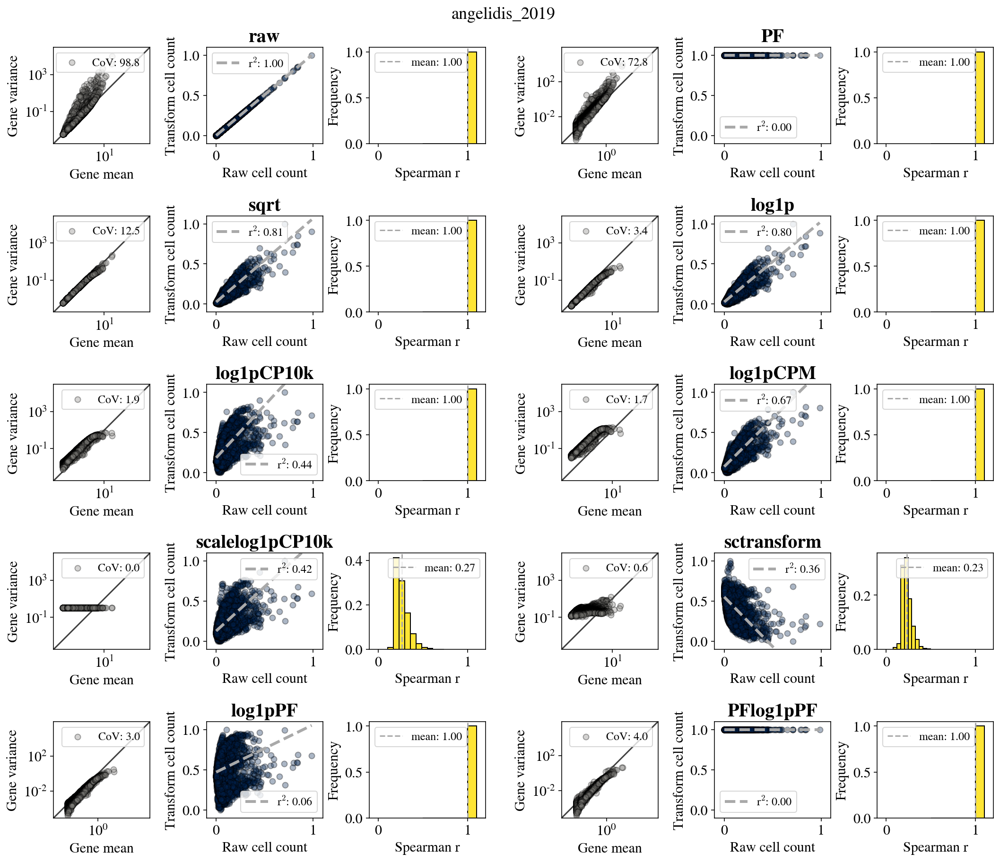

In [105]:
fig = plt.figure(figsize=(6*3,5*3))
fig.suptitle(ds, y=0.92)
gs = gridspec.GridSpec(5, 2, figure=fig, wspace=0.15, hspace=0.75)
axs = []
for i in range(5):
    for j in range(2):
        ig = gs[i,j].subgridspec(1, 3, wspace=0.4)
        ax1 = fig.add_subplot(ig[0, 0])
        ax2 = fig.add_subplot(ig[0, 1])
        ax3 = fig.add_subplot(ig[0, 2])
        axs.append((ax1, ax2, ax3))

raw = data["raw"]

minlim = min(np.min(np.var(raw, 0)), np.min(np.mean(raw, 0))) * 0.1
maxlim = max(np.max(np.var(raw, 0)), np.max(np.mean(raw, 0))) * 10
for (ax1, ax2, ax3), title in zip(axs, labels):
    m = data[title]
    plot_meanvar(m, raw.mean(0), minlim = minlim, maxlim = maxlim, ax=ax1)
    plot_depth(m, raw.sum(1), ax2)
    plot_mono(m, raw, ax3)
    ax2.set_title(title, fontsize=20, weight="bold")

fig.savefig(f"{ds}_methods_metrics.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")
fig.show()

In [106]:
def pairwise_spearman(X, mn=0):
    # break ties 
    mns = np.random.uniform(-mn/4, mn/4, size=X.shape[1])
    X = X.astype(float) + mns
    corr = stats.spearmanr(X, axis=1).correlation
    corr = corr[np.triu_indices(corr.shape[0], k=1)]
    return corr

def trim_axs(axs, N):
    """little helper to massage the axs list to have correct length..."""
    axs = axs.flat
    for ax in axs[N:]:
        ax.remove()
    return axs[:N]

In [107]:
%%time
mins = {}
for l in labels:
    mins[l] = get_min_diff(data[l])
mins

CPU times: user 6min 58s, sys: 17.5 s, total: 7min 15s
Wall time: 7min 15s


{'raw': 1,
 'PF': 5.551115123125783e-17,
 'sqrt': 0.008884064315125784,
 'log1p': 0.0003156067566045806,
 'log1pCP10k': 6.107294758805892e-07,
 'log1pCPM': 6.108287102790655e-07,
 'scalelog1pCP10k': 6.001865671123596e-13,
 'sctransform': 6.106226635438361e-16,
 'log1pPF': 1.1102230246251565e-16,
 'PFlog1pPF': 2.882971639195375e-10}

In [108]:
metrics = {}
for k, m in data.items():
    print(k)
    gvar = np.var(m, axis=0)
    gmean = np.mean(m, axis=0)
    cellsum = np.sum(m, axis=1)
    depth_pearson, _ = stats.pearsonr(data["raw"].sum(1), cellsum)
    
    cutoff = 0.2
    metrics[k] = {
        "cov_gene_var": np.sqrt(np.var(gvar))/np.mean(gvar),
        "cov_gene_var_mean_upper": np.sqrt(np.var(gvar[gmean >= cutoff]))/np.mean(gvar[gmean >= cutoff]),
        "cov_gene_var_mean_lower": np.sqrt(np.var(gvar[gmean < cutoff]))/np.mean(gvar[gmean < cutoff]),
        "mono": mono(m, data["raw"]).mean(),
        "depth_pearson": depth_pearson,
        "cov_cell_depth": np.sqrt(np.var(cellsum)) / np.mean(cellsum)
    }

raw
PF
log1p
log1pPF
PFlog1pPF
log1pCPM
log1pCP10k
sqrt
sctransform
scalelog1pCP10k


In [1188]:
[(k, i["cov_cell_depth"]) for k, i in metrics.items()]

[('raw', 0.990769672107577),
 ('pf', 1.961584110825267e-16),
 ('log', 0.7276646671264669),
 ('pf_log', 0.2164986206440084),
 ('pf_log_pf', 1.8619725541087078e-16),
 ('cpm_log', 0.523226607648556),
 ('cp10k_log', 0.36324585930806086),
 ('sqrt', 0.7166784470547205),
 ('sctransform', -0.4796266200952659),
 ('cp10k_log_scale', -2531796537616785.0)]

In [ ]:
# bar graph on cov_cell_depth without sctransform and cpls

In [911]:
[(i, metrics[i]["depth_pearson"]) for i in metrics.keys()]

[('raw', 1.0),
 ('pf', 6.879823486461385e-07),
 ('log', 0.7966636224242475),
 ('pf_log', 0.05711143254189563),
 ('pf_log_pf', 1.2574860297694354e-05),
 ('cpm_log', 0.6720563235426532),
 ('cp10k_log', 0.4350416422190814),
 ('sqrt', 0.8119311150198034),
 ('sctransform', 0.3605874637890887),
 ('cp10k_log_scale', 0.42273103194745976)]

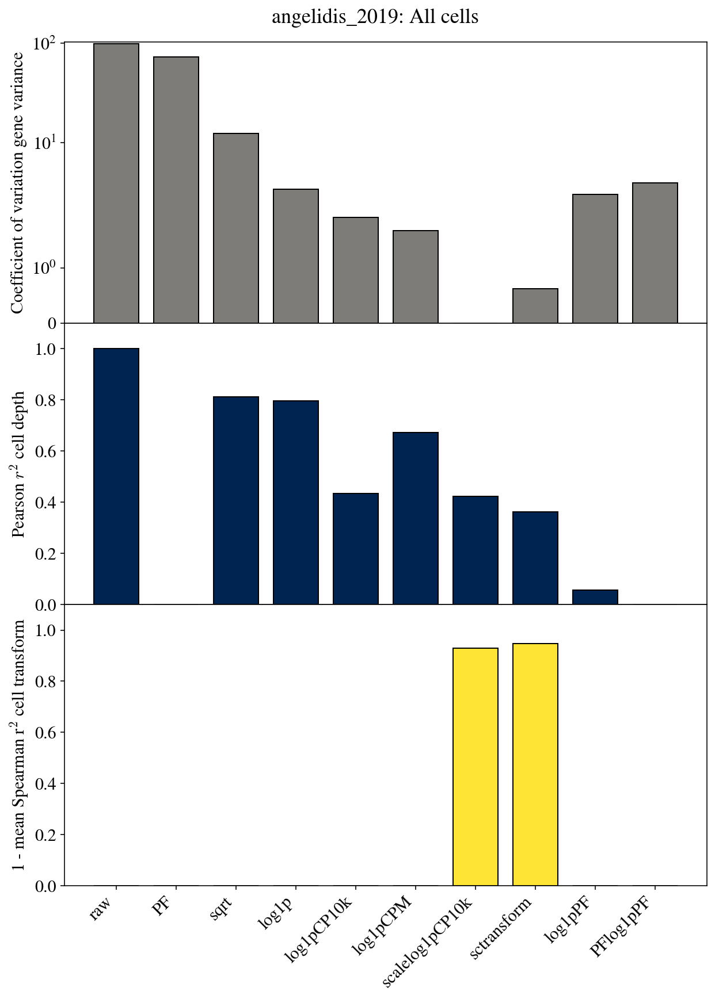

In [190]:
nr=3

fig, axs = plt.subplots(figsize=(10,4.5*nr), nrows=nr)
fig.suptitle(f"{ds}: All cells", y=0.91)
fig.subplots_adjust(hspace=0)

# x = ["\n".join(i.split("_")) for i in labels]
x = labels
xx = np.arange(len(labels))  # the label locations
width = 0.75  # the width of the bars

p = {
    "xticks": [],
    "xticklabels": []

}

##################
ax = axs[0]

y = np.array([metrics[i]["cov_gene_var"] for i in labels])
ax.bar(xx, y, width, label='Gene variance', edgecolor="k", color=colors["gene"])

p.update({
    "ylim": 0,
    "yscale" : "symlog",
    "ylabel": "Coefficient of variation gene variance"
})

ax.set(**p)

##################
ax = axs[1]

y = np.array([metrics[i]["depth_pearson"] for i in labels])
ax.bar(xx, y**2, width, label='Cell depth', edgecolor="k", color=colors["cell"])

p.update({
    "ylabel": "Pearson $r^2$ cell depth",
    "yscale": "linear",
    "ylim": (0,1.1)
})

ax.set(**p)


##################
ax = axs[2]

y = np.array([metrics[i]["mono"] for i in labels])
ax.bar(xx, 1 - y**2, width, label='Monotonicity', edgecolor="k", color=colors["mono"])

p.update({
    "yscale": "linear",
    "xticks": xx,
    "ylim": (0, 1.1),
    "ylabel": "1 - mean Spearman r$^2$ cell transform"
})
ax.set(**p)
ax.set_xticklabels(x, ha="right", rotation=45)


fig.savefig(f"{ds}_metrics.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")
fig.show()

# Celltype spearman

In [17]:
pd.DataFrame({"cellsum": data["raw"].sum(1), "celltype":assignments}).groupby("celltype").agg({"cellsum": ["var", "count", "sum", "mean"]})["cellsum"].sort_values(["count"], ascending=False)

,var,count,sum,mean
celltype,,,,
Type_2_pneumocytes,3.808068e+05,4199,3717832,885.408907
Alveolar_macrophage,2.463729e+05,1704,1185836,695.913146
Ciliated_cells,1.227495e+06,883,887542,1005.143828
B_cells,2.415417e+05,855,496537,580.745029
Club_cells,2.957619e+06,772,1221242,1581.919689
vascular_endothelial_cells,5.747923e+04,631,279089,442.296355
CD8+_T_cells,2.166643e+05,612,389606,636.611111
Cd4+_T_cells,1.352873e+05,591,336177,568.827411
low_quality_cells,3.294878e+04,495,214193,432.713131


In [19]:
celltypes = ["Type_2_pneumocytes", "Alveolar_macrophage", "Ciliated_cells"]
ct_masks = [assignments == i for i in celltypes]

In [184]:
ct = celltypes[0]
ct_mask = ct_masks[0]

In [185]:
ct

'Type_2_pneumocytes'

## Pairwise

In [123]:
%%time
ct_sp = defaultdict(dict)
for c, c_mask in zip(celltypes, ct_masks):
    print(c)
    l = data["raw"][c_mask].sum(0)
    downsample_genes = l > 0
    for l in labels:
        print(l)
        mtx = data[l]
        X = mtx[ct_mask][:,downsample_genes]
        ct_sp[l][c] = pairwise_spearman(X, mn=mins[l])


Type_2_pneumocytes
raw
PF
sqrt
log1p
log1pCP10k
log1pCPM
scalelog1pCP10k
sctransform
log1pPF
PFlog1pPF
Alveolar_macrophage
raw
PF
sqrt
log1p
log1pCP10k
log1pCPM
scalelog1pCP10k
sctransform
log1pPF
PFlog1pPF
Ciliated_cells
raw
PF
sqrt
log1p
log1pCP10k
log1pCPM
scalelog1pCP10k
sctransform
log1pPF
PFlog1pPF
CPU times: user 22min 48s, sys: 5min 56s, total: 28min 44s
Wall time: 6min 24s


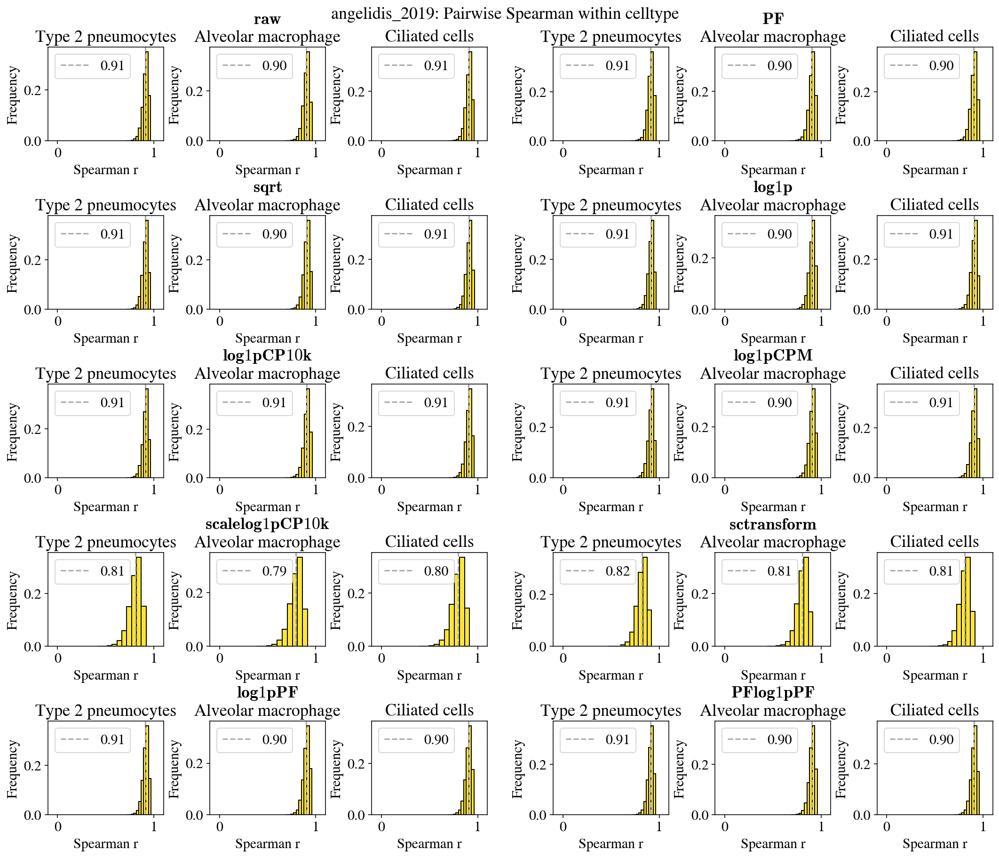

In [336]:
fig = plt.figure(figsize=(6*3,5*3))
fig.suptitle(f"{ds}: Pairwise Spearman within celltype", y=0.92)
gs = gridspec.GridSpec(5, 2, figure=fig, wspace=0.15, hspace=0.8)
axs = []
for i in range(5):
    for j in range(2):
        ig = gs[i,j].subgridspec(1, 3, wspace=0.4)
        ax1 = fig.add_subplot(ig[0, 0])
        ax2 = fig.add_subplot(ig[0, 1])
        ax3 = fig.add_subplot(ig[0, 2])
        axs.append((ax1, ax2, ax3))

minlim = -0.1
maxlim = 1.1

p = {
    "xlabel": "Spearman r",
    "ylabel": "Frequency",
    "xlim": (minlim, maxlim)
}

for ax, title in zip(axs, labels):
    for idx, (a, c) in enumerate(zip(ax, celltypes)):
        x = ct_sp[title][c]
        
        c = ' '.join(c.split('_'))
    
        weights = np.ones(len(x)) / len(x)
        a.hist(x, weights=weights, facecolor=colors["mono"], edgecolor="k")
        a.axvline(x.mean(), color="darkgray", linestyle="--", label=f"{x.mean():,.2f}")
        p.update({"title": c})
        if idx == 1:
            p.update({"title": fr"$\bf{title}$" + f"\n{c}"})

        a.set(**p)
        a.legend()
fig.savefig(f"{ds}_celltype_pairwise_spearman.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")
fig.show()

In [129]:
ct_metrics = defaultdict(dict)

In [130]:
# celltype specific metrics
# This will be on Alveolar macrophages

for k, v in ct_sp.items():
    for m, s in v.items():
        ct_metrics[k]["ct_spearman"] = s.mean()


In [131]:
ct_metrics

defaultdict(dict,
            {'raw': {'ct_spearman': 0.9070562761534202},
             'PF': {'ct_spearman': 0.9037933116930131},
             'sqrt': {'ct_spearman': 0.9091188406653046},
             'log1p': {'ct_spearman': 0.9062186967575089},
             'log1pCP10k': {'ct_spearman': 0.9060319622139607},
             'log1pCPM': {'ct_spearman': 0.9065926677567709},
             'scalelog1pCP10k': {'ct_spearman': 0.7956653520897112},
             'sctransform': {'ct_spearman': 0.8089209735001752},
             'log1pPF': {'ct_spearman': 0.9046156133204049},
             'PFlog1pPF': {'ct_spearman': 0.9049295181116986}})

## knee and mean var

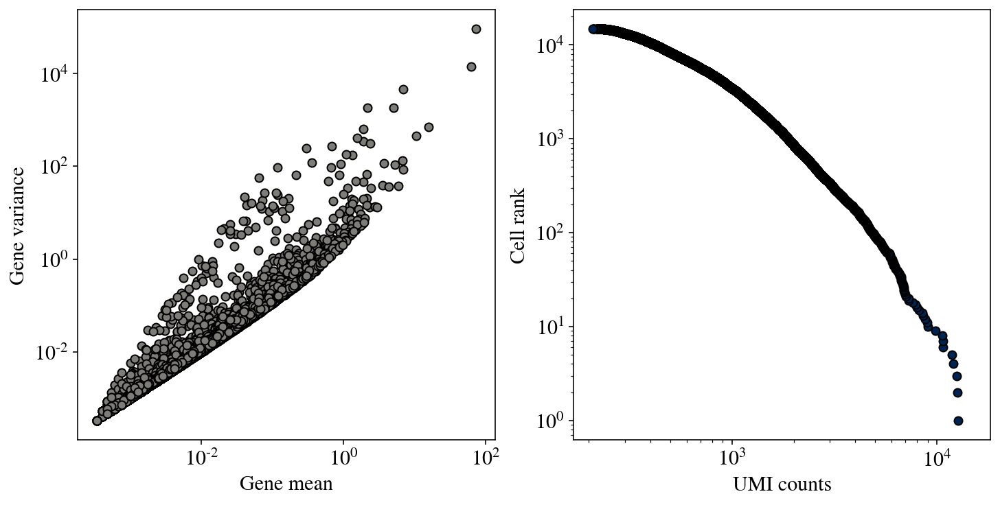

In [337]:
fig, axs = plt.subplots(figsize=(10, 5), ncols=2, constrained_layout=True)

ax = axs[0]

x = data["raw"].mean(0)
y = np.var(data["raw"], axis=0)

ax.scatter(x,y, facecolor=colors["gene"], edgecolor="k")

ax.set(**{
    "xlabel": "Gene mean",
    "ylabel": "Gene variance",
    "xscale": "log",
    "yscale": "log"
})

ax = axs[1]

x = np.sort(data["raw"].sum(1))[::-1]
y = np.arange(x.shape[0])

ax.scatter(x,y, facecolor=colors["cell"], edgecolor="k")

ax.set(**{
    "xscale": "log",
    "yscale": "log",
    "xlabel": "UMI counts",
    "ylabel": "Cell rank"
})

fig.savefig(f"{ds}_knee_meanvar.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

In [351]:
variances = {k: np.var(v, axis=0) for k,v in data.items()}

In [352]:
raw_genemean = data["raw"].mean(0)

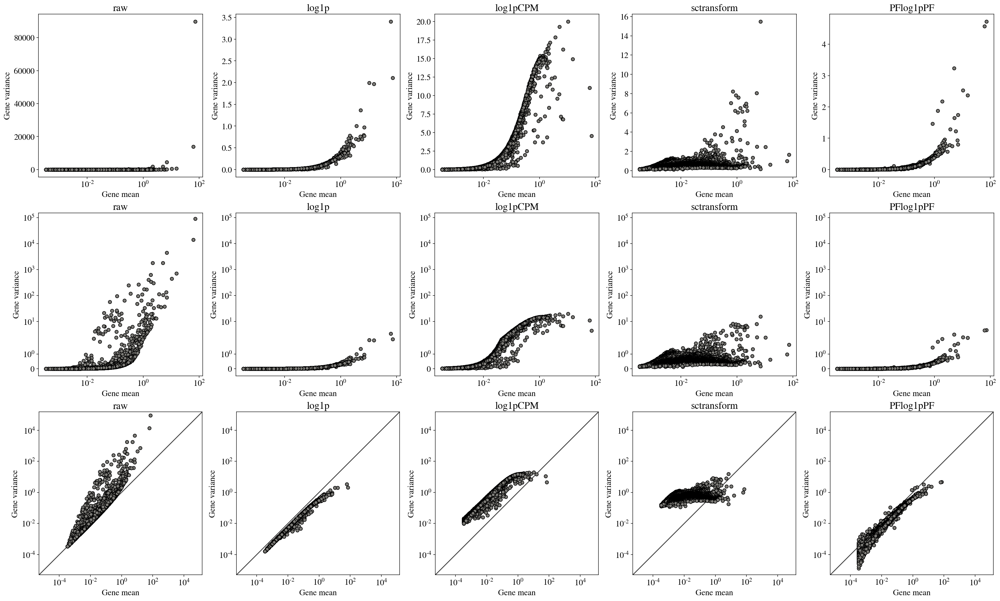

In [384]:
nc = 5
nr = 3

fig, axs = plt.subplots(figsize=(5*nc, 5*nr), ncols=nc, nrows=nr, constrained_layout=True)

pltlabels = ["raw", "log1p", "log1pCPM", "sctransform", "PFlog1pPF"]

for idx, l in enumerate(pltlabels):
    ax = axs[0, idx]

    x = raw_genemean
    y = variances[l]

    ax.scatter(x,y, facecolor=colors["gene"], edgecolor="k")

    ax.set(**{
        "xlabel": "Gene mean",
        "ylabel": "Gene variance",
        "xscale": "log",
        "yscale": "linear",
#         "ylim": (-1e4, 1.5e5),
        "title": l
    })

for idx, l in enumerate(pltlabels):
    ax = axs[1, idx]

    x = raw_genemean
    y = variances[l]

    ax.scatter(x,y, facecolor=colors["gene"], edgecolor="k")

    ax.set(**{
        "xlabel": "Gene mean",
        "ylabel": "Gene variance",
        "xscale": "log",
        "yscale": "symlog",
        "ylim": (-0.5, 1.5e5),
        "title": l
    })
    
for idx, l in enumerate(pltlabels):
    ax = axs[2, idx]

    x = raw_genemean
    y = variances[l]

    ax.scatter(x,y, facecolor=colors["gene"], edgecolor="k")

    ax.set(**{
        "xlabel": "Gene mean",
        "ylabel": "Gene variance",
        "xscale": "log",
        "yscale": "log",
        "ylim": (5e-6, 1.5e5),
        "title": l
    })
    yex(ax)
    
fig.savefig(f"{ds}_different_meanvar_plot_styles.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

In [385]:
a = np.array([
[1, 1, 1, 1, 0],
[0, 0, 2, 0, 1],
[2, 2, 1, 0, 0],
[2, 0, 2, 3, 0],
[0, 1, 1, 1, 0],
])

In [390]:
np.log(normalize(a, axis=0)*1e4)

array([[8.11172808, 8.31446064, 8.01139274, 8.01139274,       -inf],
       [      -inf,       -inf, 8.70453992,       -inf, 9.21034037],
       [8.80487526, 9.00760782, 8.01139274,       -inf,       -inf],
       [8.80487526,       -inf, 8.70453992, 9.11000502,       -inf],
       [      -inf, 8.31446064, 8.01139274, 8.01139274,       -inf]])

## cp10k_log_scale v sctransform

In [132]:
def corr2_coeff(A, B):
    # Rowwise mean of input arrays & subtract from input arrays themeselves
    A_mA = A - A.mean(1)[:, None]
    B_mB = B - B.mean(1)[:, None]

    # Sum of squares across rows
    ssA = (A_mA**2).sum(1)
    ssB = (B_mB**2).sum(1)

    # Finally get corr coeff
    return np.dot(A_mA, B_mB.T) / np.sqrt(np.dot(ssA[:, None],ssB[None]))

In [133]:
pr = defaultdict()
for c, c_mask in zip(celltypes, ct_masks):
    pr[c] = np.diagonal(corr2_coeff(data["scalelog1pCP10k"][c_mask], data["sctransform"][c_mask]))

In [134]:
spr = defaultdict()
for c, c_mask in zip(celltypes, ct_masks):
    spr[c] = np.diagonal(corr2_coeff(stats.rankdata(data["scalelog1pCP10k"][c_mask], axis=1), stats.rankdata(data["sctransform"][c_mask], axis=1)))

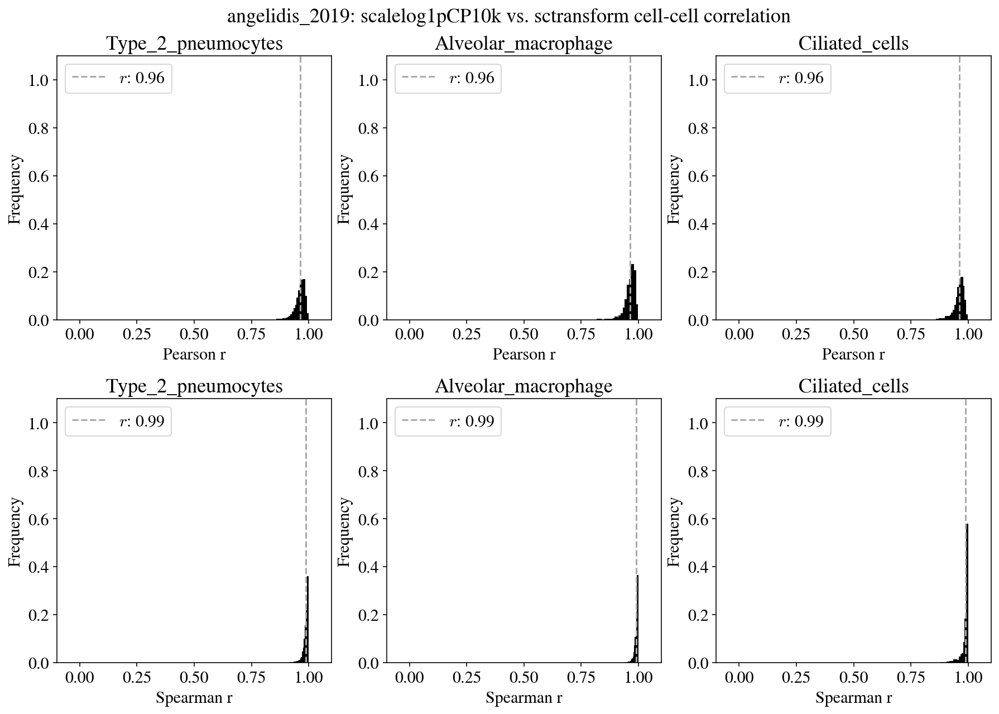

In [338]:
nr, nc = 2, 3
fig, axs = plt.subplots(figsize=(5*nc,5*nr), ncols=nc, nrows=nr)
fig.suptitle(f"{ds}: scalelog1pCP10k vs. sctransform cell-cell correlation", y=0.94)
fig.subplots_adjust(hspace=0.3)
p = {
        "xlim": (-0.1, 1.1)
}


for idx, c in enumerate(celltypes):
    ax = axs[0,idx]

    x = pr[c]

    weights=np.ones(len(x)) / len(x)
    ax.hist(x, weights=weights, facecolor="k", edgecolor="k", bins=20)
    ax.axvline(x.mean(), label=f"$r$: {x.mean():,.2f}", linestyle="--", color="darkgray")
    ax.set(**{
        "xlim": (-0.1, 1.1),
        "ylim": (0, 1.1),
        "title": c,
        "xlabel": "Pearson r",
        "ylabel": "Frequency"
    })
    ax.legend()

for idx, c in enumerate(celltypes):
    ax = axs[1,idx]
    p.update({"title": f"{c}"})

    x = spr[c]

    weights=np.ones(len(x)) / len(x)
    ax.hist(x, weights=weights, facecolor="k", edgecolor="k", bins=20)
    ax.axvline(x.mean(), label=f"$r$: {x.mean():,.2f}", linestyle="--", color="darkgray")
    ax.set(**{
        "xlim": (-0.1, 1.1),
        "ylim": (0, 1.1),
        "title": c,
        "xlabel": "Spearman r",
        "ylabel": "Frequency"
    })
    
    ax.legend()
fig.savefig(f"{ds}_scalelog1pCP10k_sctransform_pearson_spearman.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

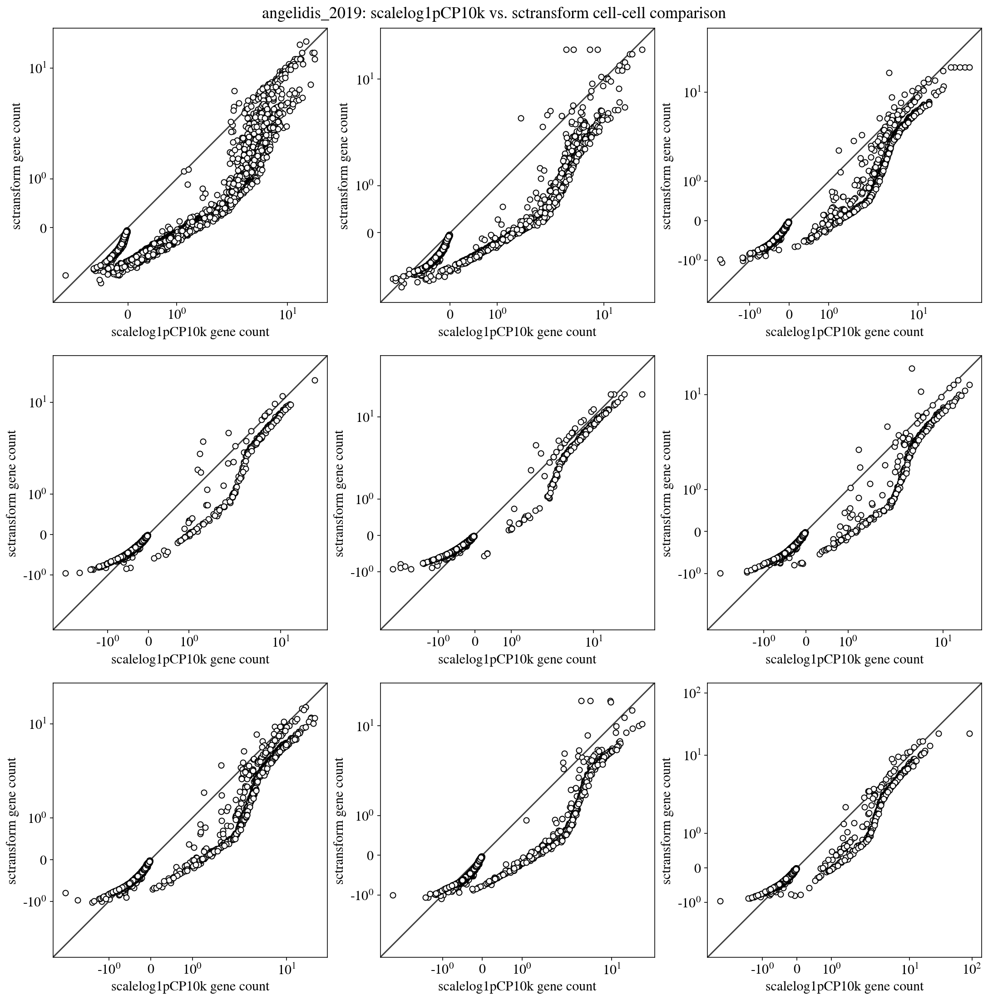

In [340]:
n = 3
fig, axs = plt.subplots(figsize=(5*n,5*n), ncols=n, nrows=n, constrained_layout=True)
fig.suptitle(f"{ds}: scalelog1pCP10k vs. sctransform cell-cell comparison", y=1.01)

for idx, ax in enumerate(fig.axes):
    x = data["scalelog1pCP10k"][-idx]
    y = data["sctransform"][-idx]
    ax.scatter(x,y, facecolor="white", edgecolor="k")
    
    ax.set(**{
        "xlabel": "scalelog1pCP10k gene count",
        "ylabel": "sctransform gene count",
        "xscale": "symlog",
        "yscale": "symlog",
    })
    yex(ax)


fig.savefig(f"{ds}_scalelog1pCP10k_sctransform_spearman_cell_examples.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

# PC variance

In [226]:
data["raw"].shape

(14813, 16541)

In [217]:
pc_fit.keys()

dict_keys(['raw', 'PF', 'log1p', 'log1pPF', 'PFlog1pPF', 'log1pCPM', 'log1pCP10k', 'sqrt', 'sctransform'])

In [221]:
    print(title)
    pca = PCA(n_components=1, svd_solver='full')
    Y = pca.fit_transform(data["scalelog1pCP10k"][ct_mask])
    pc_comps["scalelog1pCP10k"] = pca.components_
    pc_fit["scalelog1pCP10k"] = Y

scalelog1pCP10k


In [222]:
%%time
# ## data for pc
pc_comps = {}
pc_fit = {}
for title, matrix in data.items():
    print(title)
    pca = PCA(n_components=1, svd_solver='full')
    Y = pca.fit_transform(matrix[ct_mask])
    pc_comps[title] = pca.components_
    pc_fit[title] = Y

In [223]:
ct_mask.sum()

4199

In [227]:
pc_norm = defaultdict()

for idx, l in enumerate(labels):
    # magnitude of pc
    pc = np.abs(pc_comps[l]) # gene loadings
    
    # normalize between zero and one
    pcn = normalize(pc, norm="l1")[0]
    
    # compute the entropy
    ent = stats.entropy(pcn)
    
    print(f"{l}\t{ent}")
    # save norm vector
    pc_norm[l] = pcn
    
    # save entropy to ct_metrics
    ct_metrics[l]["pc_entropy"] = ent

raw	5.976929973592593
PF	5.3669956608835685
sqrt	8.360781912110474
log1p	8.42779545156364
log1pCP10k	8.583779951129223
log1pCPM	8.683813337301101
scalelog1pCP10k	9.168871956866905
sctransform	9.316099200853275
log1pPF	8.23609068786596
PFlog1pPF	8.16321989449759


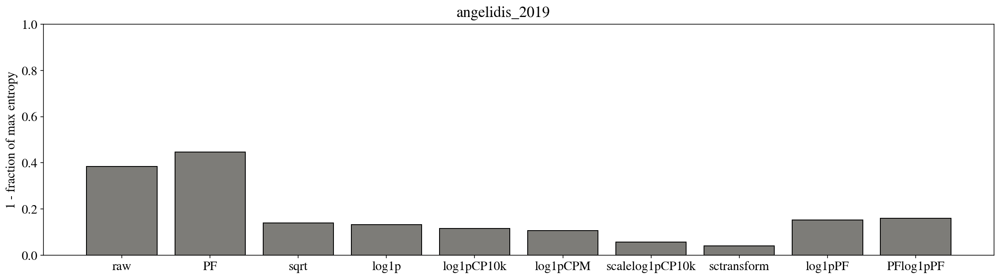

In [228]:
fig, ax = plt.subplots(figsize=(20,5))
fig.suptitle(ds, y=0.94)
x = labels
y = [ct_metrics[i]["pc_entropy"] for i in x]
max_ent = np.log(len(genes))
ax.bar(x,(max_ent - y)/max_ent, facecolor=colors["gene"], edgecolor="k")
ax.set(**{
    "ylabel": "1 - fraction of max entropy",
    "ylim": (0, 1)
})
#fig.savefig(f"{ds}_pc_entropy.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")
fig.show()

In [704]:
# todo make this plot for svensson data

In [230]:
pc_comps["raw"]

array([[ 3.94294932e-03,  2.41786130e-04,  1.79817639e-04, ...,
        -0.00000000e+00,  1.10535489e-05,  3.09940094e-06]])

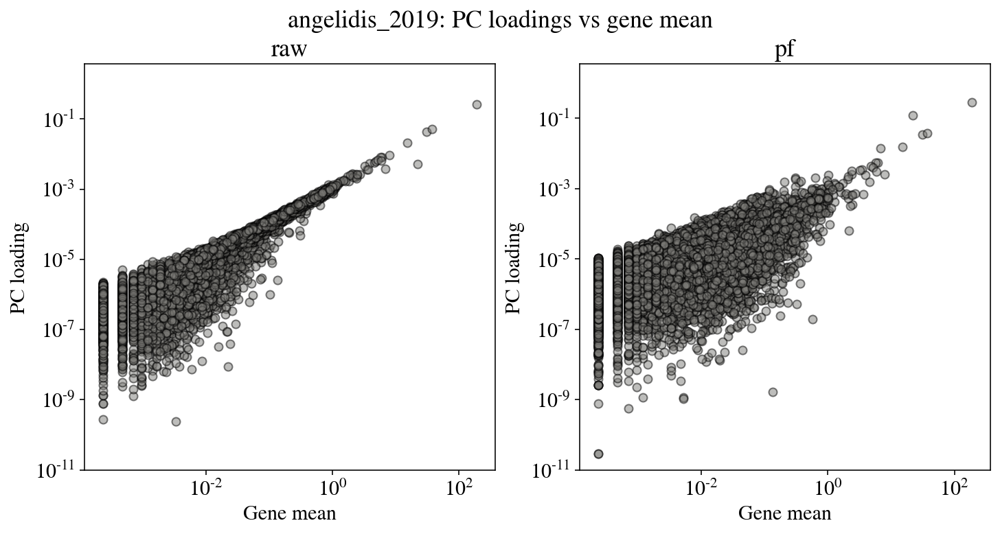

In [341]:
fig, axs = plt.subplots(figsize=(10,5), ncols=2, constrained_layout=True)
fig.suptitle(f"{ds}: PC loadings vs gene mean", y=1.05)
ax = axs[0]

x = np.mean(data["raw"][ct_mask], 0)
y = pc_norm["raw"]



ax.scatter(x,y, alpha=0.5, facecolor=colors["gene"], edgecolor="k")
ax.set(**{
    "xscale": "log",
    "yscale": "log",
    "ylim": (1e-11),
    "xlabel": "Gene mean",
    "ylabel": "PC loading",
    "title": "raw"
})

ax = axs[1]
# todo add pf to this one
x = np.mean(data["raw"][ct_mask], 0)
y = pc_norm["PF"]

ax.scatter(x,y, alpha=0.5, facecolor=colors["gene"], edgecolor="k")
ax.set(**{
    "xscale": "log",
    "yscale": "log",
    "ylim": (1e-11),
    "xlabel": "Gene mean",
    "ylabel": "PC loading",
    "title": "pf"
})

fig.savefig(f"{ds}_pc_raw_loadings.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

(0.0, 0.141013, 0.317579, 1.0)

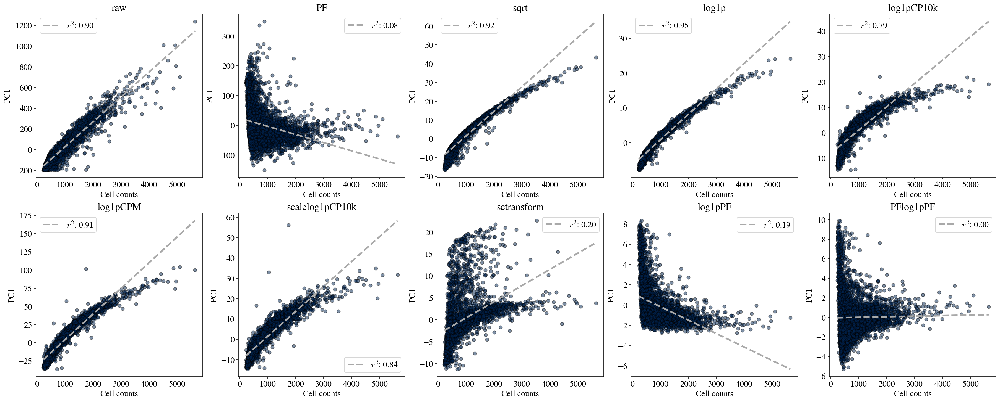

In [343]:
nr = 2
nc = 5
fig, ax = plt.subplots(figsize=(5*nc,5*nr), nrows = nr, ncols=nc, constrained_layout=True)

for ax in fig.axes[10:]:
    ax.remove()

for ax, l in zip(fig.axes, labels):
    x = data["raw"][ct_mask].sum(1)
    y = pc_fit[l].flatten()

    ax.scatter(x,y, facecolor=colors["cell"], edgecolor="k", alpha=0.5)
    
    reg = LinearRegression().fit(x.reshape(-1,1), y)
    r2 = reg.score(x.reshape(-1,1), y)
    xx = np.array([min(x), max(x)])
    ax.plot(xx, reg.coef_*xx+ reg.intercept_, color="darkgray", linestyle="--", linewidth=3, label=f"$r^2$: {r2:,.2f}")

    ax.set(**{
        "xlabel": "Cell counts",
        "ylabel": "PC1",
        "title": l
    })
    ax.legend()

fig.savefig(f"{ds}_pc_depth.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

In [330]:
pc_corr = {}
for l in labels:
    x = data["raw"][ct_mask].sum(1)
    y = pc_fit[l].flatten()
    
    reg = LinearRegression().fit(x.reshape(-1,1), y)
    r2 = reg.score(x.reshape(-1,1), y)
    pc_corr[l] = np.sqrt(r2)

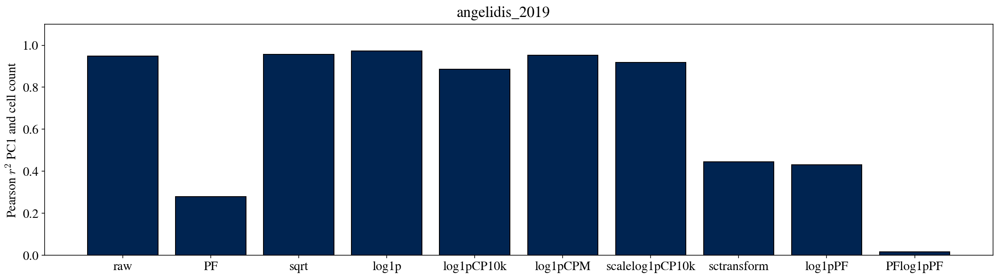

In [331]:
fig, ax = plt.subplots(figsize=(20,5))
fig.suptitle(ds, y=0.94)

x = [k for k,_ in pc_corr.items()]
y = [v for k,v in pc_corr.items()]
ax.bar(x,y, facecolor=colors["cell"], edgecolor="k")
ax.set(**{
    "ylabel": "Pearson $r^2$ PC1 and cell count",
    "ylim": (0, 1.1)
})

#fig.savefig(f"{ds}_depth_DE_genes.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

# Heatmaps

In [138]:
dropna = pd.notna(assignments)

In [139]:
mg = diff(data["PF"][dropna], bcs.index.values[dropna], genes, assignments[dropna])

09-Mar-22 23:45:55 - 1 of 33 assignments: Alveolar_macrophage
09-Mar-22 23:45:56 - 2 of 33 assignments: B_cells
09-Mar-22 23:45:57 - 3 of 33 assignments: CD209+/Cd11b+_dendritic_cells
09-Mar-22 23:45:58 - 4 of 33 assignments: CD8+_T_cells
09-Mar-22 23:45:58 - 5 of 33 assignments: Capillary_endothelial_cells
09-Mar-22 23:45:59 - 6 of 33 assignments: Ccl17+/Cd103-/Cd11b-_dendritic_cells
09-Mar-22 23:46:00 - 7 of 33 assignments: Cd103+/Cd11b-_dendritic_cells
09-Mar-22 23:46:01 - 8 of 33 assignments: Cd4+_T_cells
09-Mar-22 23:46:02 - 9 of 33 assignments: Ciliated_cells
09-Mar-22 23:46:03 - 10 of 33 assignments: Club_cells
09-Mar-22 23:46:03 - 11 of 33 assignments: Eosinophils
09-Mar-22 23:46:04 - 12 of 33 assignments: Fn1+_macrophage
09-Mar-22 23:46:05 - 13 of 33 assignments: Gamma-Delta_T_cells
09-Mar-22 23:46:07 - 14 of 33 assignments: Goblet_cells
09-Mar-22 23:46:07 - 15 of 33 assignments: Interstitial_Fibroblast
09-Mar-22 23:46:08 - 16 of 33 assignments: Interstitial_macrophages
09-Mar

In [140]:
markers = mg.query("es > 1 & p_corr < 0.01").sort_values('es', ascending = False)

markers = markers[~markers["name"].duplicated()].groupby('group_id').head(3)

mgenes = markers.sort_values("group_id")["name"]

In [141]:
%%time
heat = defaultdict(dict)
# average expression for each celltype

for title in labels:
    print(title)
    g = scale(data[title])
    c = scale(data[title], axis=1)
    
    df = pd.DataFrame(g, index=assignments)[dropna].sort_index()
    gg = df.groupby(df.index.get_level_values(0)).mean()
    asn = gg.index.values
    heat[title]["gene"] = df.values

    df = pd.DataFrame(c, index=assignments)[dropna].sort_index()
    gg = df.groupby(df.index.get_level_values(0)).mean()
    asn = gg.index.values
    heat[title]["cell"] = df.values

raw
PF
sqrt
log1p
log1pCP10k
log1pCPM
scalelog1pCP10k
sctransform
log1pPF
PFlog1pPF


In [154]:
%%time
gb = defaultdict()
# average expression for each celltype

for title in labels:
    print(title)
    m = data[title]
    
    df = pd.DataFrame(m, index=assignments)[dropna].sort_index()
    gg = df.groupby(df.index.get_level_values(0)).mean()
    asn = gg.index.values
    gb[title] = gg.values

raw
PF
sqrt
log1p
log1pCP10k
log1pCPM
scalelog1pCP10k
sctransform
log1pPF
PFlog1pPF


In [143]:
pd.Series(assignments).value_counts()

Type_2_pneumocytes                      4199
Alveolar_macrophage                     1704
Ciliated_cells                           883
B_cells                                  855
Club_cells                               772
vascular_endothelial_cells               631
CD8+_T_cells                             612
Cd4+_T_cells                             591
low_quality_cells                        495
Interstitial_macrophages                 411
Cd103+/Cd11b-_dendritic_cells            319
non-classical_monocyte_(Ly6c2-)          312
Goblet_cells                             283
Mesothelial_cells                        279
Eosinophils                              265
Vcam1+_endothelial_cells                 217
Mki67+_proliferating_cells               217
CD209+/Cd11b+_dendritic_cells            216
Capillary_endothelial_cells              210
classical_monocyte_(Ly6c2+)              195
Natural_Killer_cells                     189
red_blood_cells                          184
Plasma_cel

## z-score genes

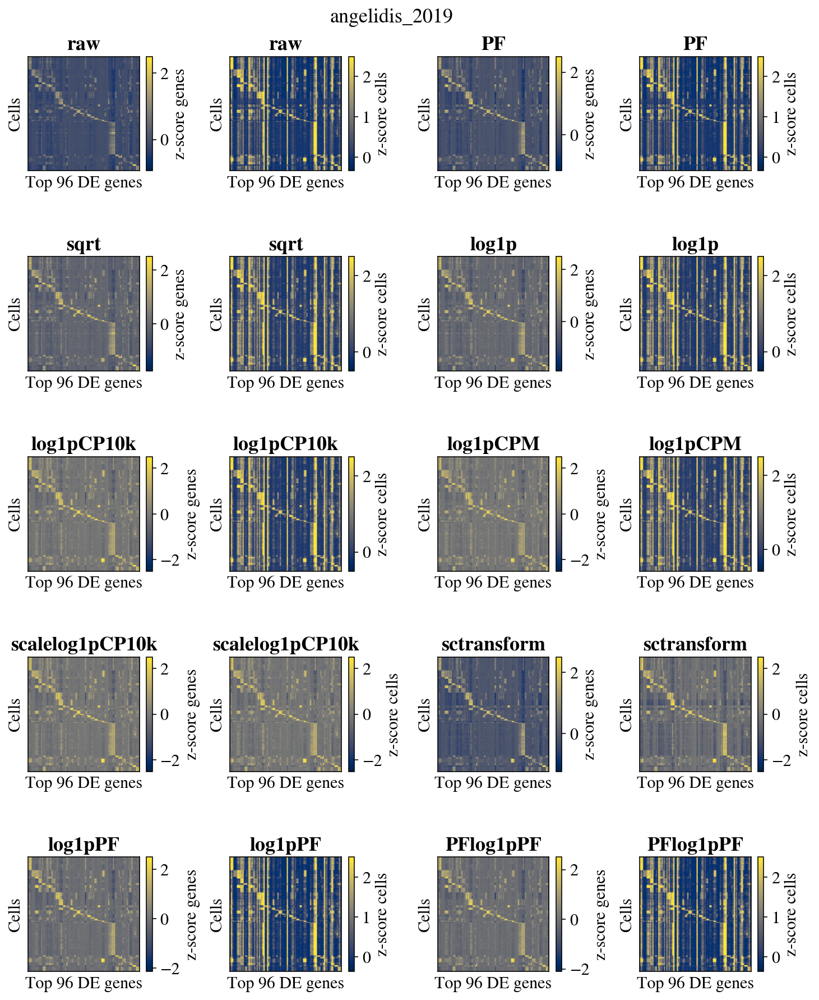

In [335]:
fig = plt.figure(figsize=(4*3,5*3))
fig.suptitle(ds, y=0.92)
gs = gridspec.GridSpec(5, 2, figure=fig, wspace=0.2, hspace=0.75)
axs = []
for i in range(5):
    for j in range(2):
        ig = gs[i,j].subgridspec(1, 2, wspace=0.45)
        ax1 = fig.add_subplot(ig[0, 0])
        ax2 = fig.add_subplot(ig[0, 1])
        axs.append((ax1, ax2))

        
p = {
        "ylabel": "Cells",
        "xlabel": f"Top {len(mgenes_idx)} DE genes",
        "xticks": [],
        "xticklabels": [],
        "yticks": [],
        "yticklabels": [],
}
mgenes_idx = [list(genes).index(i) for i in mgenes]

clip = 2.5
for (ax1, ax2), title in zip(axs, labels):
    method = title

    # every cell type across all genes
    m1 = heat[method]["gene"][:,mgenes_idx]

    # clipping for consistency
    m1[m1 >  clip]  = clip
    m1[m1 < -clip] = -clip
    
    m2 = heat[method]["cell"][:,mgenes_idx]

    m2[m2 >  clip]  = clip
    m2[m2 < -clip] = -clip
    
    
    im1 = ax1.imshow(m1, aspect="auto", cmap="cividis")
    im2 = ax2.imshow(m2, aspect="auto", cmap="cividis")

    ax1.set(**p)
    ax1.set_title(method, weight="bold")
    cbar1 = fig.colorbar(im1, ax=ax1, shrink=1, label="z-score genes")
    
    p.update({"title": f"{method}"})

    ax2.set(**p)
    ax2.set_title(method, weight="bold")
    
    cbar = fig.colorbar(im2, ax=ax2, shrink=1, label="z-score cells")

fig.savefig(f"{ds}_heatmap_scale_gene_cell.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")
fig.show()

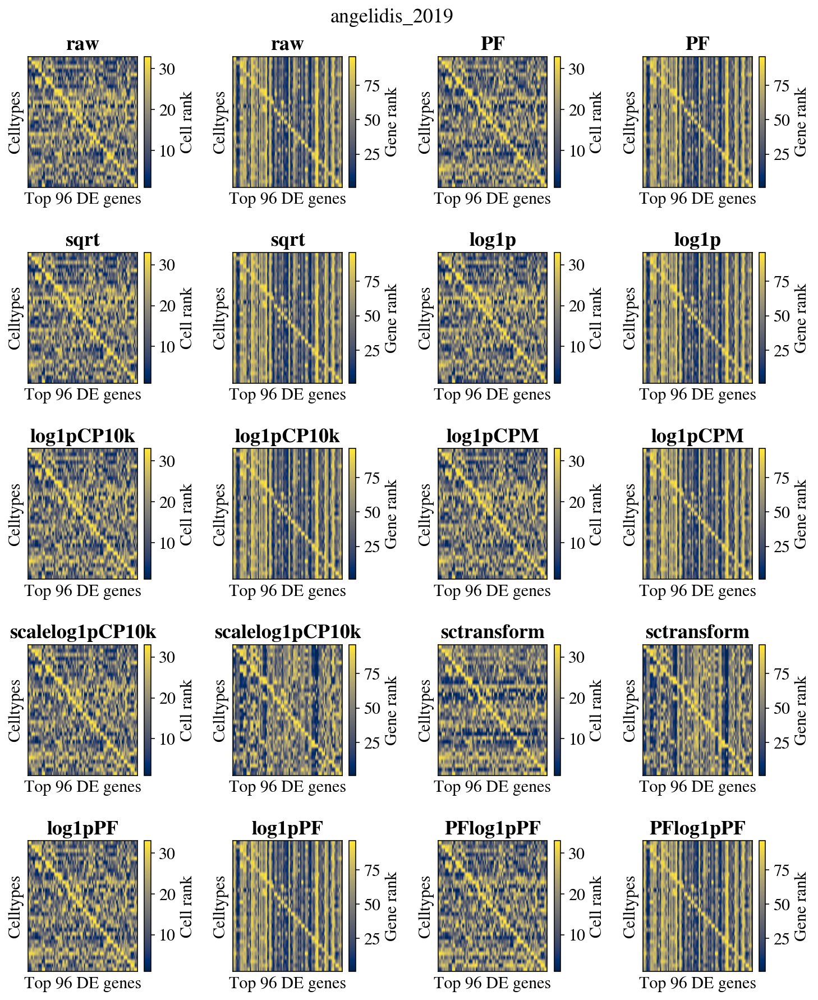

In [345]:
fig = plt.figure(figsize=(4*3,5*3))
fig.suptitle(ds, y=0.92)
gs = gridspec.GridSpec(5, 2, figure=fig, wspace=0.2, hspace=0.5)
axs = []
for i in range(5):
    for j in range(2):
        ig = gs[i,j].subgridspec(1, 2, wspace=0.5)
        ax1 = fig.add_subplot(ig[0, 0])
        ax2 = fig.add_subplot(ig[0, 1])
        axs.append((ax1, ax2))

        
p = {
        "ylabel": "Celltypes",
        "xlabel": f"Top {len(mgenes_idx)} DE genes",
        "xticks": [],
        "xticklabels": [],
        "yticks": [],
        "yticklabels": [],
}
mgenes_idx = [list(genes).index(i) for i in mgenes]

clip = 2.5
for (ax1, ax2), title in zip(axs, labels):
    method = title

    # every cell type across all genes
    m = gb[method][:,mgenes_idx]

    # for each gene, make a rank vector
    r1 = stats.rankdata(m, axis=0, method="ordinal")
    
    # for each cell make a rank vector across genes
    r2 = stats.rankdata(m, axis=1, method="ordinal")
    
    ## plot
    # genes
    im1 = ax1.imshow(r1, aspect="auto", cmap="cividis")
    ax1.set(**p)
    ax1.set_title(method, weight="bold")
    cbar1 = fig.colorbar(im1, ax=ax1, shrink=1, label="Cell rank")
    
    # cells
    im2 = ax2.imshow(r2, aspect="auto", cmap="cividis")
    ax2.set(**p)
    ax2.set_title(method, weight="bold")
    cbar2 = fig.colorbar(im2, ax=ax2, shrink=1, label="Gene rank")

fig.savefig(f"{ds}_heatmap_scale_gene_cell_rank.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")
fig.show()

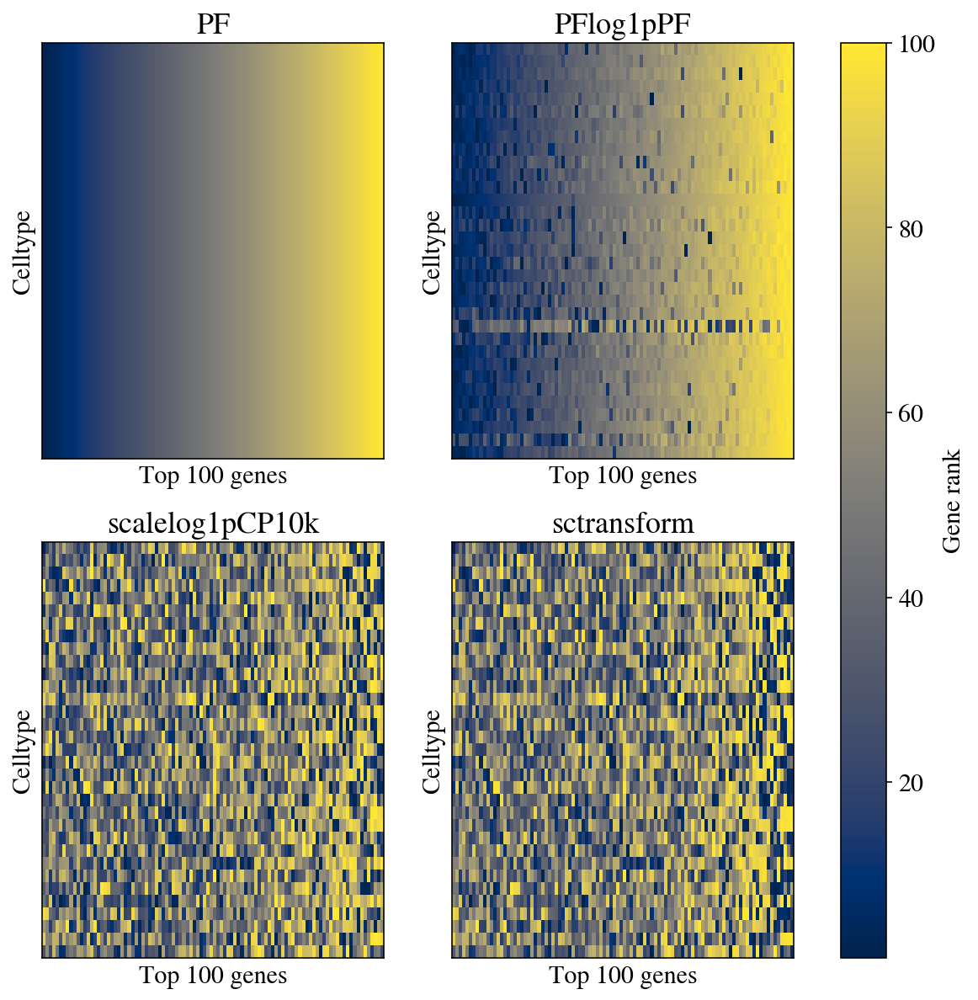

In [344]:
nr = 2
nc = 2
fig, axs = plt.subplots(figsize=(5*nc,5*nr), ncols=nc, nrows=nr)

nm = 100
ridx = np.argsort(gb["PF"], axis=1)[:,-nm:]

for l, ax in zip(['PF', 'PFlog1pPF','scalelog1pCP10k', 'sctransform'], fig.axes):
    method = l

    # every cell type across all genes
    mat = gb[method]

    # take top 100 genes (by ranking in raw expression)
    mat = np.take_along_axis(mat, ridx, 1)
    
    # plot the order of their expression
    mat = stats.rankdata(mat, axis=1, method="ordinal")
    
    im = ax.imshow(mat, aspect="auto", cmap="cividis")
    ax.set(**{
        "ylabel": "Celltype",
        "xlabel": f"Top {nm} genes",
        "xticks": [],
        "xticklabels": [],
        "yticks": [],
        "yticklabels": [],
        "title": method
    })
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=1, label="Gene rank")
fig.savefig(f"{ds}_celltype_scramble.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

In [80]:
av = {}

# all values

for title in labels:
    print(title)
    df = pd.DataFrame(data[title], index=assignments)
    gg = pd.DataFrame(data[title], index=assignments).sort_index()
    asn = gg.index.values
    av[title] = gg.values

raw
pf
sqrt
log
cp10k_log
cpm_log
cp10k_log_scale
sctransform
pf_log
pf_log_pf


In [81]:
cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["green","black","firebrick"], N=256)

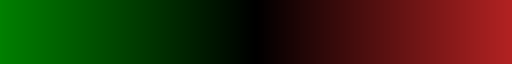

In [82]:
cmap

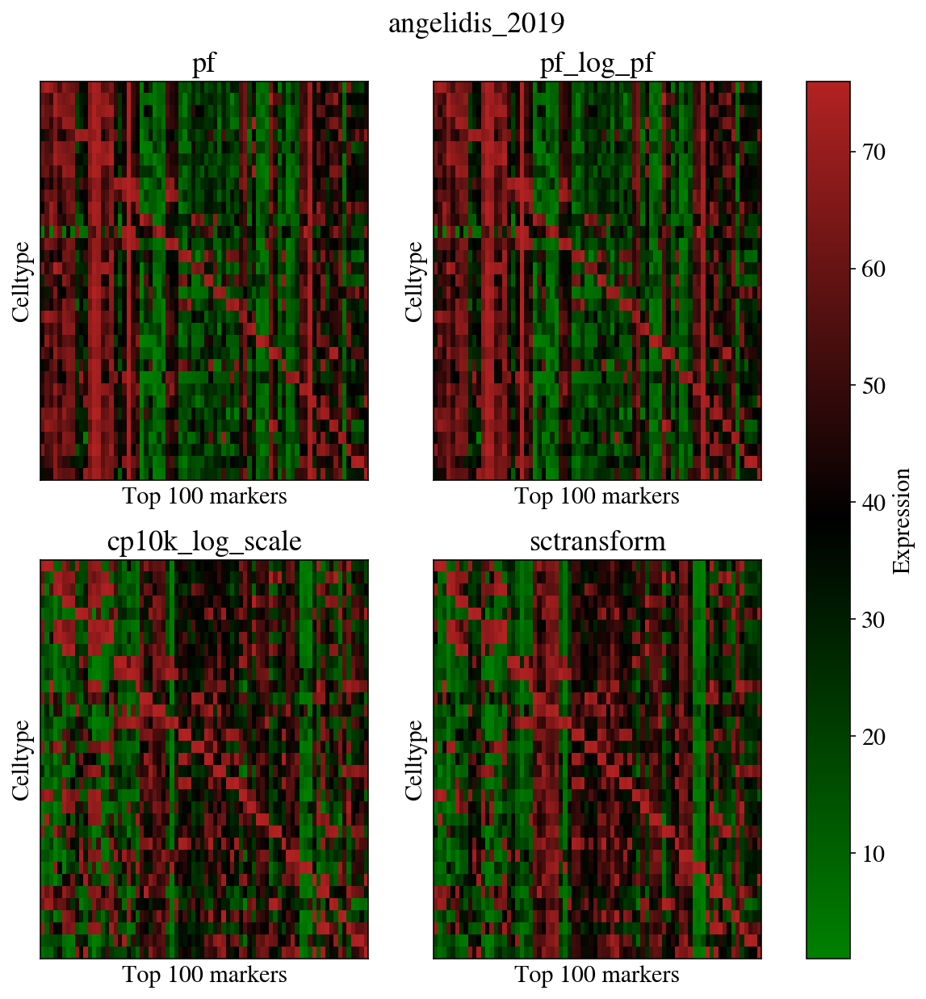

In [640]:
nr = 2
nc = 2
fig, axs = plt.subplots(figsize=(5*nc,5*nr), ncols=nc, nrows=nr)
fig.suptitle(ds, y=0.94)
mgenes_idx = [list(genes).index(i) for i in mgenes]

for l, ax in zip(pltlabels, fig.axes):
    method = l

    # every cell type across all genes
    mat = gb[method][:, mgenes_idx]

#     # take top 100 genes (by ranking in raw expression)
#     mat = np.take_along_axis(mat, ridx, 1)
    
#     # plot the order of their expression
    mat = stats.rankdata(mat, axis=1, method="ordinal")
    
    im = ax.imshow(mat, aspect="auto", cmap=cmap)
    ax.set(**{
        "ylabel": "Celltype",
        "xlabel": f"Top {nm} markers",
        "xticks": [],
        "xticklabels": [],
        "yticks": [],
        "yticklabels": [],
        "title": method
    })

cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=1, label="Expression")

fig.savefig(f"{ds}_celltype_markergene_rank_collins.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

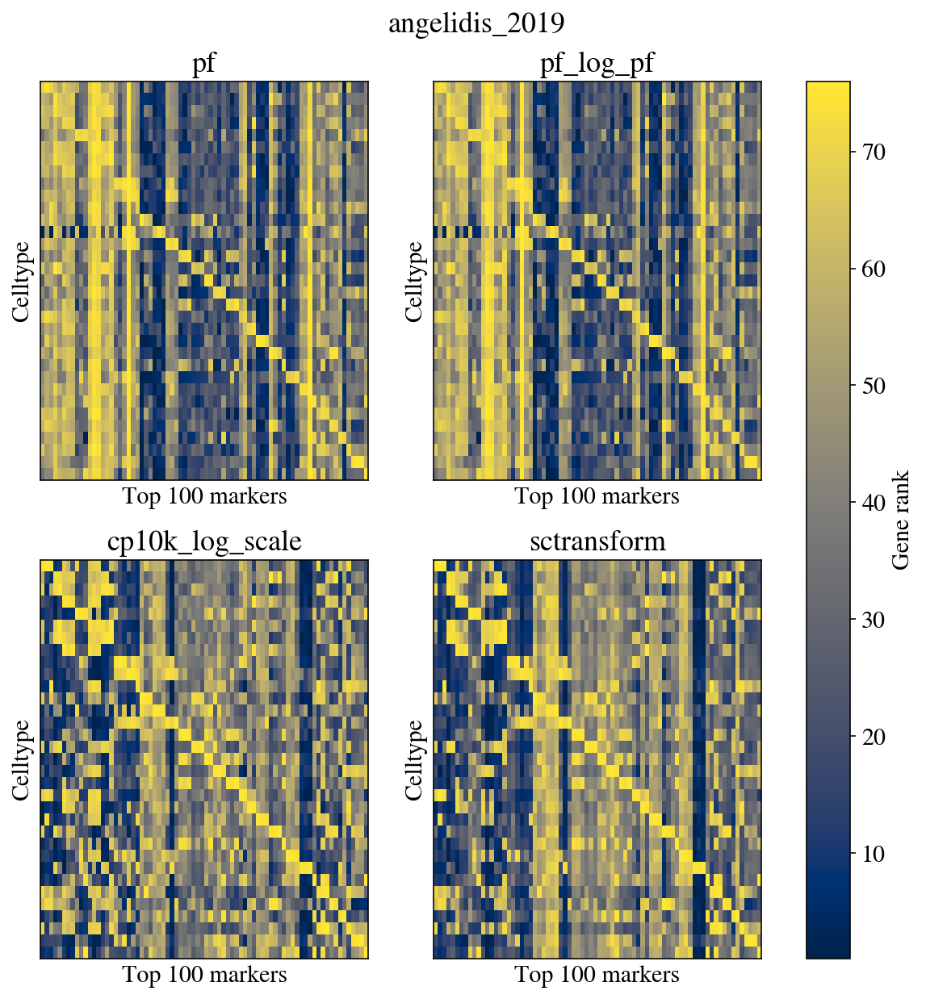

In [641]:
nr = 2
nc = 2
fig, axs = plt.subplots(figsize=(5*nc,5*nr), ncols=nc, nrows=nr)
fig.suptitle(ds, y=0.94)
mgenes_idx = [list(genes).index(i) for i in mgenes]

for l, ax in zip(pltlabels, fig.axes):
    method = l

    # every cell type across all genes
    mat = gb[method][:, mgenes_idx]

#     # take top 100 genes (by ranking in raw expression)
#     mat = np.take_along_axis(mat, ridx, 1)
    
#     # plot the order of their expression
    mat = stats.rankdata(mat, axis=1, method="ordinal")
    
    im = ax.imshow(mat, aspect="auto", cmap="cividis")
    ax.set(**{
        "ylabel": "Celltype",
        "xlabel": f"Top {nm} markers",
        "xticks": [],
        "xticklabels": [],
        "yticks": [],
        "yticklabels": [],
        "title": method
    })
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=1, label="Gene rank")

fig.savefig(f"{ds}_celltype_markergene_rank.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

In [1028]:
pltlabels = ['raw',
 'pf_log_pf',
'cp10k_log_scale',
 'sctransform',
]

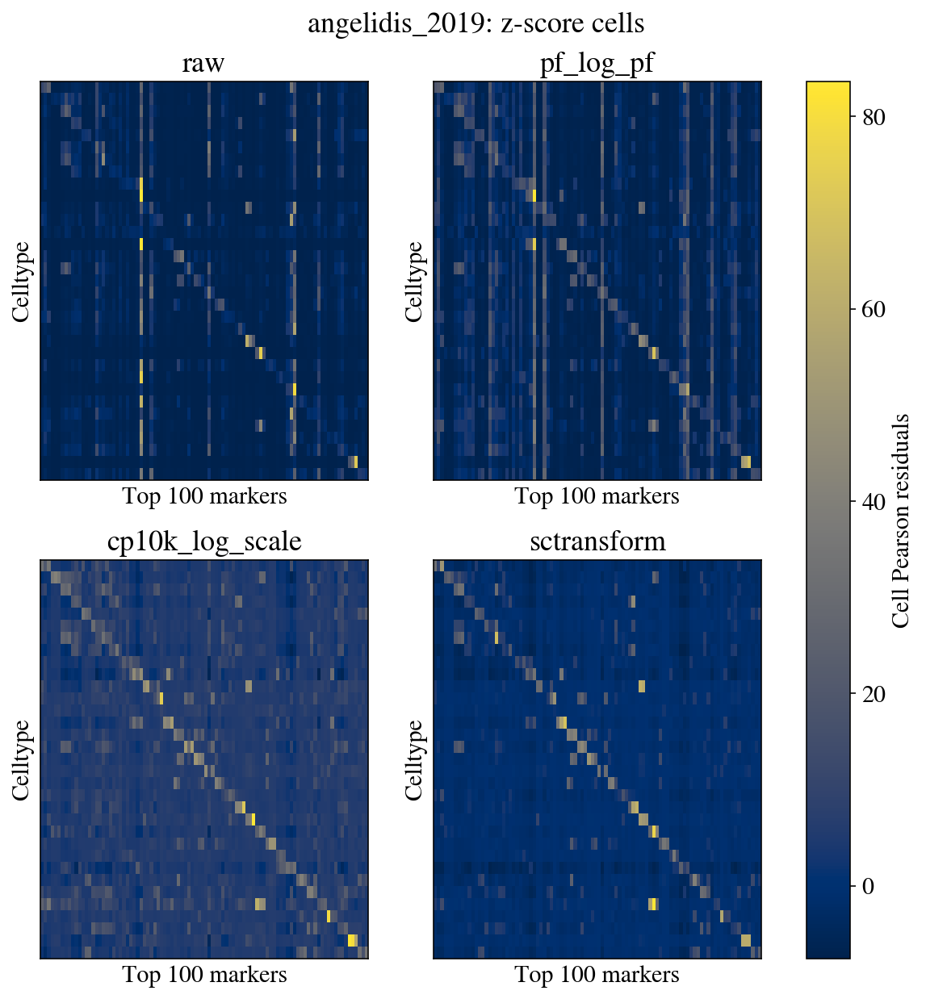

In [1058]:
nr = 2
nc = 2
fig, axs = plt.subplots(figsize=(5*nc,5*nr), ncols=nc, nrows=nr)
fig.suptitle(f"{ds}: z-score cells", y=0.94)
mgenes_idx = [list(genes).index(i) for i in mgenes]

for l, ax in zip(pltlabels, fig.axes):
    method = l

    # every cell type across all genes
    mat = gb[method]
    
    # scale genes to zero mean unit variance
    mat = scale(mat, axis=1)
    
    mat = mat[:, mgenes_idx]
    
    im = ax.imshow(mat, aspect="auto", cmap="cividis")
    ax.set(**{
        "ylabel": "Celltype",
        "xlabel": f"Top {nm} markers",
        "xticks": [],
        "xticklabels": [],
        "yticks": [],
        "yticklabels": [],
        "title": method
    })
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=1, label="Cell Pearson residuals")

#fig.savefig(f"{ds}_celltype_markergene_rank.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

In [ ]:
# when looking at celltypes, you will rank the top genes by "Expression"
# you wont see the top genes being the same with cls or sctransform because the ranking of cells is scrambled
# the top genes could be shared between many celltypes and you dont know whether a gene is highly expressed over all or specific to that celltype

In [436]:
# ctd = {}
# ct = celltypes[0]
# ct_mask = ctype_masks[0]

# for title in labels:
#     df = pd.DataFrame(data[title], index=assignments)
#     df = df[ct_mask]
#     ctd[title] = df.values

In [448]:
mats= {}
rankmats={}

In [644]:
pltlabels = ['raw',
 'pf_log_pf',
'cp10k_log_scale',
 'sctransform',
]

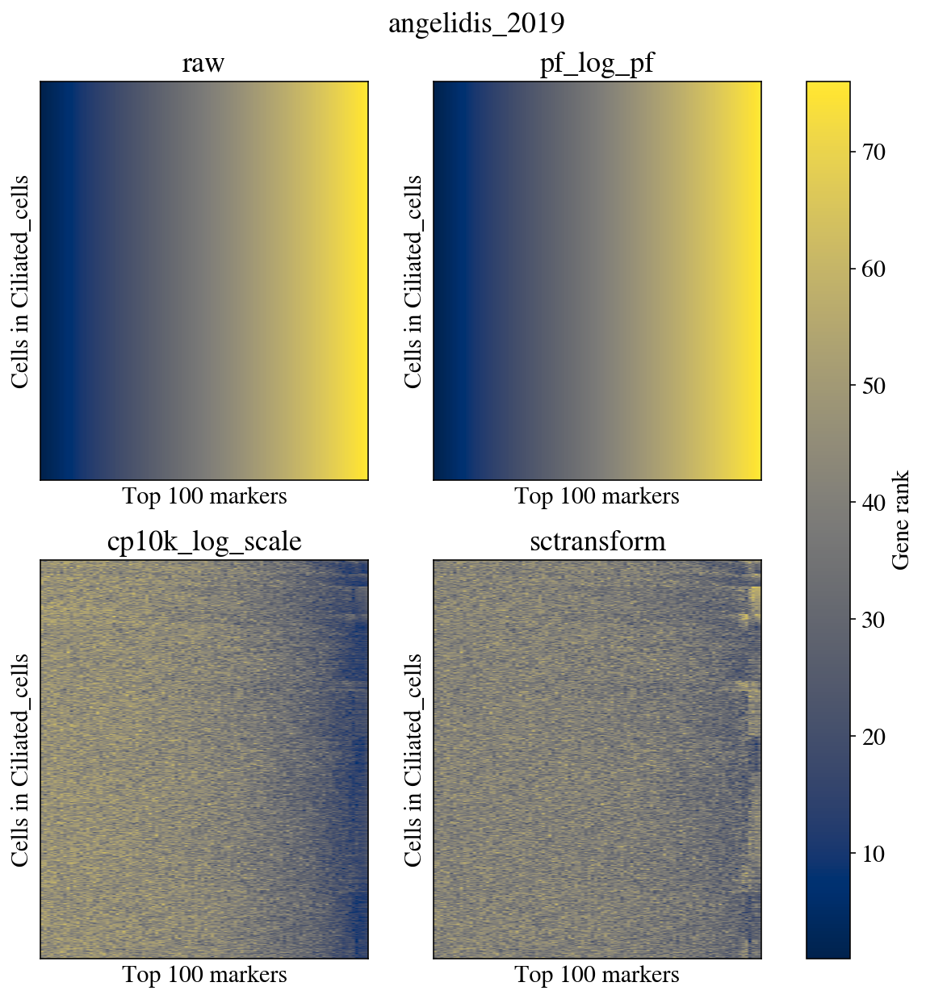

In [645]:
nr = 2
nc = 2
fig, axs = plt.subplots(figsize=(5*nc,5*nr), ncols=nc, nrows=nr)
fig.suptitle(ds, y=0.94)

nm = 100
ridx = np.argsort(ctd["raw"], axis=1)[:,-nm:]

for l, ax in zip(pltlabels, fig.axes):
    method = l

    # every cell type across all genes
    mat = ctd[method]

    # take top 100 genes (by ranking in raw expression)
    mat = np.take_along_axis(mat, ridx, 1)
    mats[l] = mat
    # plot the order of their expression
    mat = stats.rankdata(mat, axis=1, method="ordinal")
    rankmats[l] = mat
    
    ax.imshow(mat, aspect="auto", cmap="cividis")
    ax.set(**{
        "ylabel": f"Cells in {ct}",
        "xlabel": f"Top {nm} markers",
        "xticks": [],
        "xticklabels": [],
        "yticks": [],
        "yticklabels": [],
        "title": method
    })
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), shrink=1, label="Gene rank")
fig.savefig(f"{ds}_cell_scramble.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

# DE on highest variable cluster

In [163]:
cellsum = data["raw"][ct_mask].sum(1)

In [164]:
n = 1000
min_sidx, max_sidx = np.array_split(np.argsort(cellsum), 2)

# ## for truncating
min_sidx = min_sidx[500:n]
max_sidx = max_sidx[-500:]
subset_idx = np.hstack([min_sidx, max_sidx])

# # # if truncating, use stack and sidx (on rows of matrix)
stack = np.hstack([np.zeros_like(min_sidx), np.ones_like(max_sidx)])
split_ct_assignments = stack

# # if not truncating then use this
# split_ct_assignments = np.hstack([stack[min_sidx], stack[max_sidx]])



In [165]:
dfs = {}
for l in labels:
    dfs[l] = diff(data[l][ct_mask][subset_idx], bcs[ct_mask].index.values[subset_idx], genes, split_ct_assignments)

10-Mar-22 00:51:11 - 1 of 2 assignments: 0
10-Mar-22 00:51:11 - 2 of 2 assignments: 1
10-Mar-22 00:51:11 - /home/sina/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:143: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

10-Mar-22 00:51:11 - 1 of 2 assignments: 0
10-Mar-22 00:51:11 - 2 of 2 assignments: 1
10-Mar-22 00:51:12 - 1 of 2 assignments: 0
10-Mar-22 00:51:12 - 2 of 2 assignments: 1
10-Mar-22 00:51:12 - 1 of 2 assignments: 0
10-Mar-22 00:51:12 - 2 of 2 assignments: 1
10-Mar-22 00:51:13 - 1 of 2 assignments: 0
10-Mar-22 00:51:13 - 2 of 2 assignments: 1
10-Mar-22 00:51:13 - 1 of 2 assignments: 0
10-Mar-22 00:51:13 - 2 of 2 assignments: 1
10-Mar-22 00:51:14 - 1 of 2 assignments: 0
10-Mar-22 00:51:14 - 2 of 2 assignments: 1
10-Mar-22 00:51:15 - 1 of 2 assignments: 0
10-Mar-22 00:51:15 - 

In [166]:
res = {}
alpha = 0.01
for l in labels:
    df = dfs[l].query(f'p_corr < {alpha}')
    res[l] = df
    ct_metrics[l]["de_genes"] = df.name.nunique()

In [167]:
# histogram for read depth with lines
# make upset plot

10-Mar-22 21:47:07 - /home/sina/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  if sys.path[0] == '':



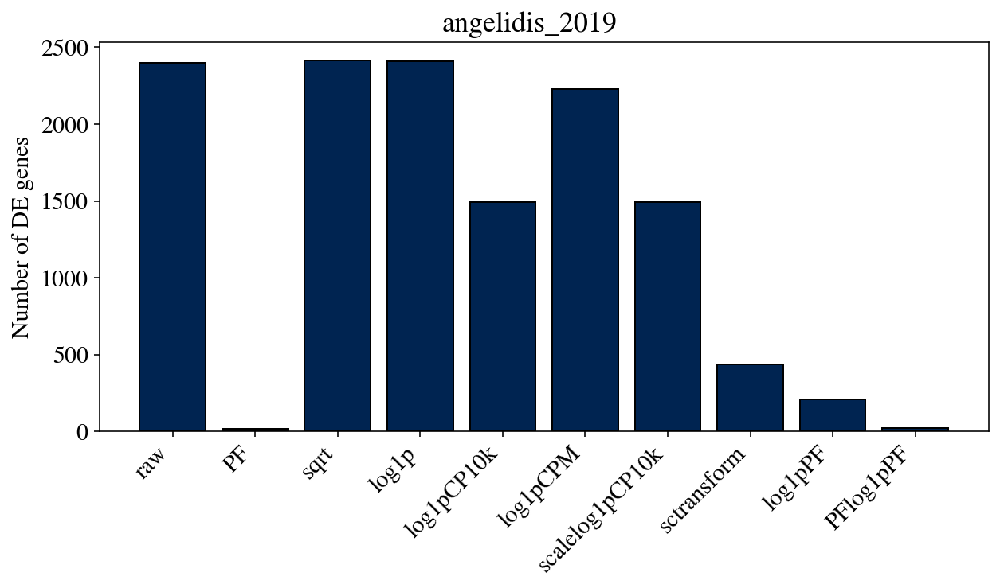

In [334]:
fig, ax = plt.subplots(figsize=(10,4.5))
fig.suptitle(ds, y=0.94)

x = [k for k,_ in res.items()]
y = [v.name.nunique() for k,v in res.items()]
ax.bar(x,y, facecolor=colors["cell"], edgecolor="k")
ax.set(**{
    "ylabel": "Number of DE genes",

})

ax.set_xticklabels(x, ha="right", rotation=45)

fig.savefig(f"{ds}_depth_de_bar.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

# Cell depth and clustering

In [274]:
from sklearn.metrics import pairwise_distances

In [282]:
n = 1000
sample_cells = np.random.choice(ct_mask.sum(), 1000, replace=False)
depth = pairwise_distances(data["raw"][ct_mask][sample_cells].sum(1).reshape(-1,1), metric="l1")
depth = depth[np.triu_indices(depth.shape[0], k = 1)]

In [284]:
%%time
dist = {}
for l in labels:
    print(l)
    pw = pairwise_distances(data[l][ct_mask][sample_cells], metric="l1")
    v = pw[np.triu_indices(pw.shape[0], k = 1)]
    dist[l] = v

raw
PF
sqrt
log1p
log1pCP10k
log1pCPM
scalelog1pCP10k
sctransform
log1pPF
PFlog1pPF
CPU times: user 1min 59s, sys: 1.82 s, total: 2min 1s
Wall time: 2min 1s


In [285]:
for l in labels:
    x = depth
    y = dist[l]
    r,p = stats.pearsonr(x,y)
    ct_metrics[l]["depth_distance"] = r

In [290]:
depth_mask = depth > 500

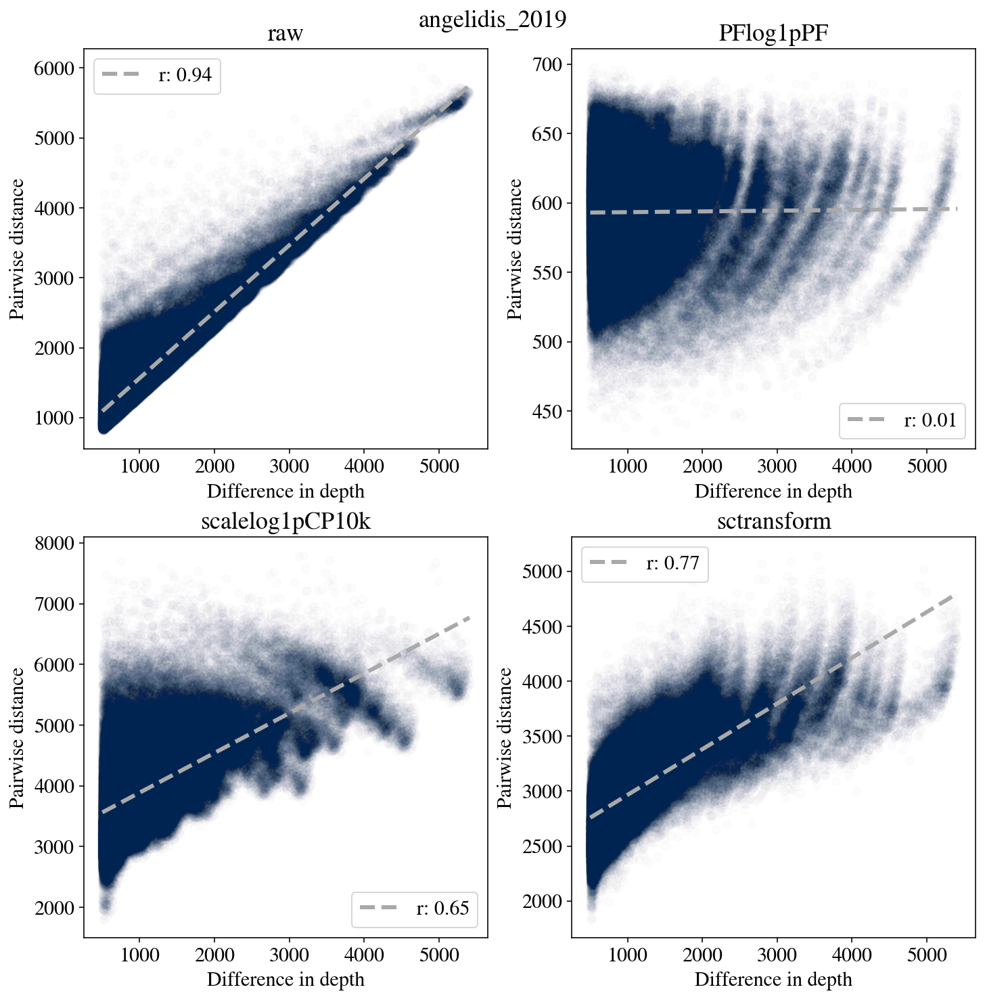

In [347]:
nc = 2
nr = 2

fig, axs = plt.subplots(figsize=(5*nc,5*nr), nrows=nr, ncols=nc, constrained_layout=True)
fig.suptitle(ds, y=1.01)
# fig.subplots_adjust(hspace=0.3, wspace=0.3)
for ax, l in zip(fig.axes, ["raw", "PFlog1pPF", "scalelog1pCP10k", "sctransform"]):
    x = depth[depth_mask]
    y = dist[l][depth_mask]
    r,p = stats.pearsonr(x,y)
    ax.scatter(x,y, alpha=0.01, facecolor=colors["cell"])
    reg = LinearRegression().fit(x.reshape(-1,1), y)

    xx = np.array([min(x), max(x)])
    ax.plot(xx, reg.coef_*xx+ reg.intercept_, color="darkgray", linestyle="--", linewidth=3, label=f"r: {r:,.2f}")

    ax.set(**{
        "xlabel": "Difference in depth",
        "ylabel": "Pairwise distance",
        "title": l,
    })
    ax.legend()
fig.savefig(f"{ds}_dist_depth_scatter.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

10-Mar-22 21:42:46 - /home/sina/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  if sys.path[0] == '':



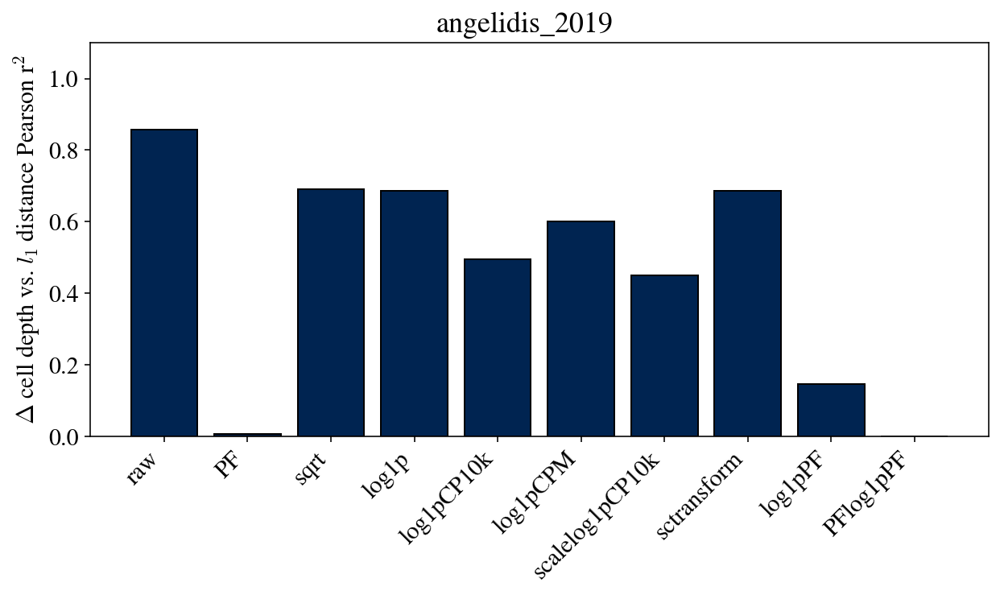

In [333]:
fig, ax = plt.subplots(figsize=(10,4.5))
fig.suptitle(ds, y=0.94)

x = [k for k,_ in ct_metrics.items()]
y = np.array([v["depth_distance"] for k,v in ct_metrics.items()])
ax.bar(x,y**2, facecolor=colors["cell"], edgecolor="k")
ax.set(**{
    "ylabel": "$\Delta$ cell depth vs. $l_1$ distance Pearson r$^2$",
    "ylim": (0, 1.1)

})
ax.set_xticklabels(x, ha="right", rotation=45)

fig.savefig(f"{ds}_depth_dist_bar.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()

# Celltype specific figure

In [297]:
for k, v in data.items():
    # pairwise spearman then the mean of that
    ct_metrics[k]["mono"] = np.diagonal(corr2_coeff(stats.rankdata(v[ct_mask], axis=1), stats.rankdata(data["raw"][ct_mask], axis=1))).mean()

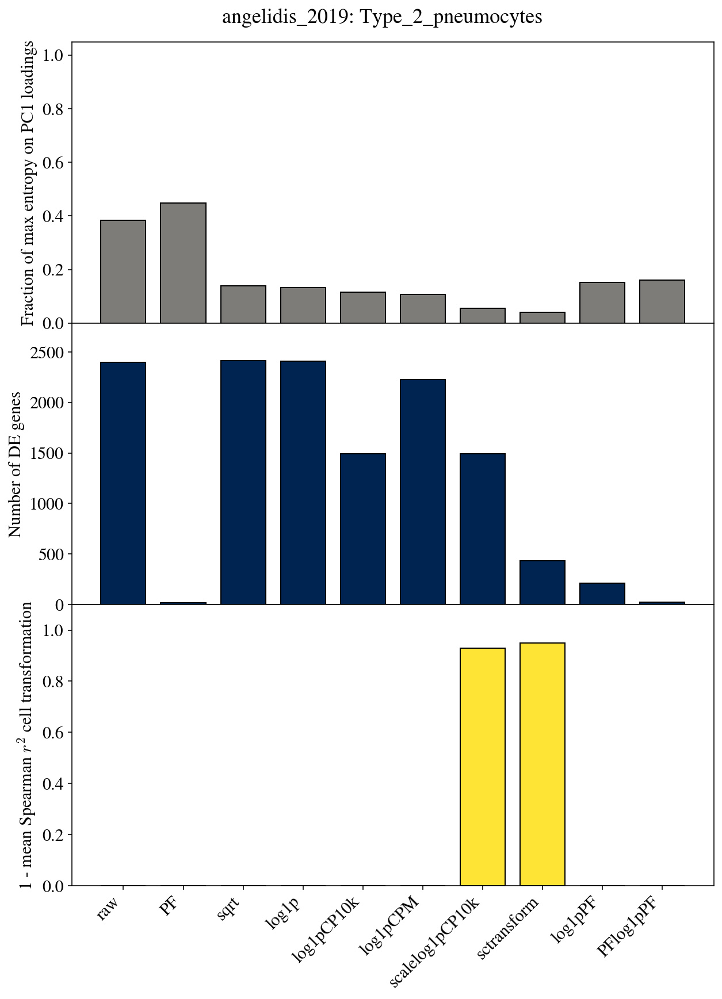

In [299]:
nr=3

fig, axs = plt.subplots(figsize=(10,4.5*nr), nrows=nr)
fig.suptitle(f"{ds}: {ct}", y=0.91)
fig.subplots_adjust(hspace=0)

# x = ["\n".join(i.split("_")) for i in labels]
x = labels
xx = np.arange(len(labels))  # the label locations
width = 0.75  # the width of the bars

p = {
    "xticks": [],
    "xticklabels": []

}

##################
ax = axs[0]

maxent = -np.log(1/data["raw"].shape[1])

y = np.array([ct_metrics[i]["pc_entropy"] for i in labels])
ax.bar(xx, (maxent - y)/maxent, width, label='PC entropy', edgecolor="k", color=colors["gene"])

p.update({
    "ylim": (0, 1.05),
    "ylabel": "Fraction of max entropy on PC1 loadings"
})

ax.set(**p)

##################
ax = axs[1]

y = np.array([ct_metrics[i]["de_genes"] for i in labels])
ax.bar(xx, y, width, label='False positive DE genes', edgecolor="k", color=colors["cell"])

p.update({
    "ylim": (0, ax.get_ylim()[1]*1.1),
    "ylabel": "Number of DE genes",
})

ax.set(**p)


##################
ax = axs[2]

y = np.array([ct_metrics[i]["mono"] for i in labels])
ax.bar(xx, 1-y**2, width, label='pairwise_sp', edgecolor="k", color=colors["mono"])

p.update({
    "yscale": "linear",
    "xticks": xx,
    "ylim": (0, 1.1),
    "ylabel": "1 - mean Spearman $r^2$ cell transformation",
})
ax.set(**p)
ax.set_xticklabels(x, ha="right", rotation=45)

fig.savefig(f"{ds}_celltype_metrics.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")
fig.show()

In [308]:
x

['raw',
 'PF',
 'sqrt',
 'log1p',
 'log1pCP10k',
 'log1pCPM',
 'scalelog1pCP10k',
 'sctransform',
 'log1pPF',
 'PFlog1pPF']

10-Mar-22 21:41:25 - /home/sina/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:34: UserWarning: FixedFormatter should only be used together with FixedLocator



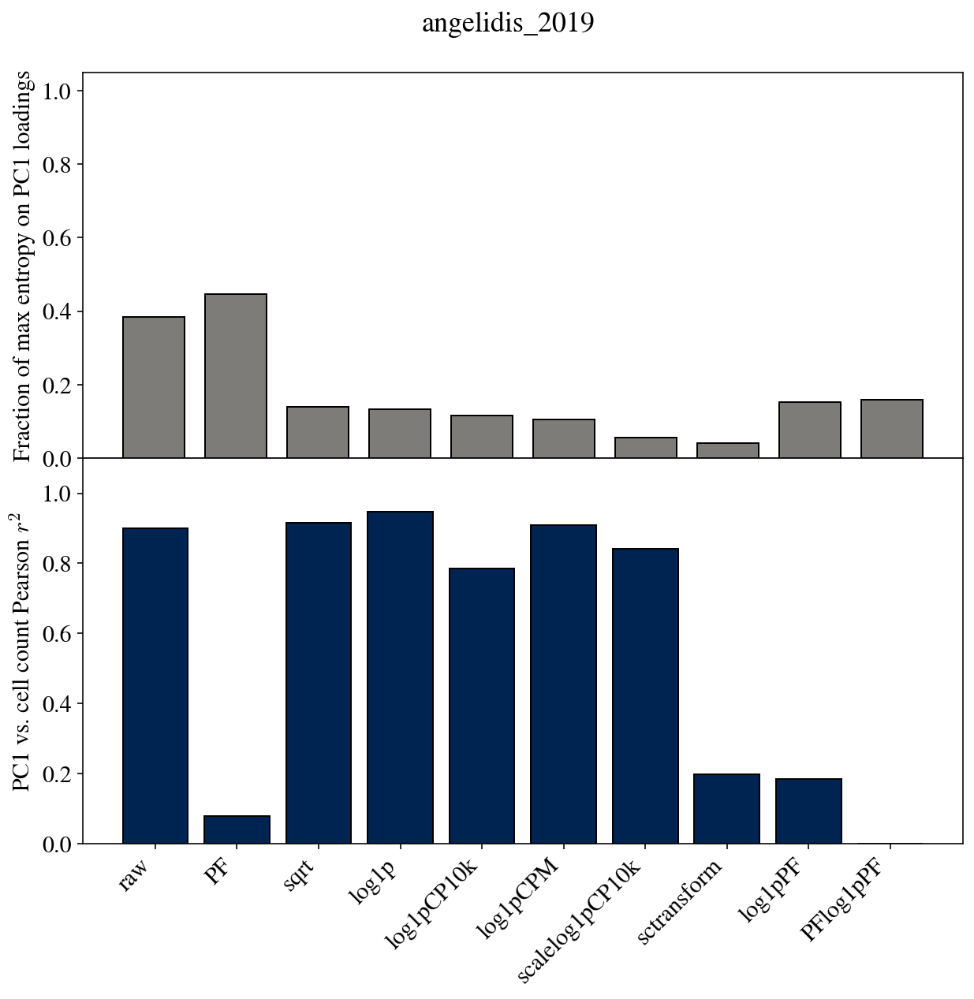

In [332]:
fig, axs = plt.subplots(figsize=(10,4.5*2), nrows=2)
fig.suptitle(ds, y=0.94)
fig.subplots_adjust(hspace=0)

ax = axs[0]


x = [k for k,_ in pc_corr.items()]

maxent = -np.log(1/data["raw"].shape[1])

y = np.array([ct_metrics[i]["pc_entropy"] for i in x])
ax.bar(x, (maxent - y)/maxent, width, label='PC entropy', edgecolor="k", color=colors["gene"])

p.update()

ax.set(**{
    "ylim": (0, 1.05),
    "ylabel": "Fraction of max entropy on PC1 loadings"
})

##################
ax = axs[1]



y = np.array([v for k,v in pc_corr.items()])
ax.bar(x,y**2, facecolor=colors["cell"], edgecolor="k")
ax.set(**{
    "ylabel": "PC1 vs. cell count Pearson $r^2$",
    "ylim": (0, 1.1)
})

ax.set_xticklabels(x, ha="right", rotation=45)

fig.savefig(f"{ds}_dim_reduce.png", facecolor='white', transparent=False, dpi=300, bbox_inches="tight")

fig.show()